## Get result from gadi and manipulate by python
- vu1 2 2 
- vu2 2 2 
- tkly1 4 2 
- ltdz1 3 3 
- zdt1 10 2
- zdt1 20 2 
- zdt2 10 2 
- zdt2 20 2
- zdt3 10 2
- zdt3 20 2
- kur1 2 2 -5.05 5
- kur1 3 2 -5.05 5
- kur1 4 2 -5.05 5
- kur1 5 2 -5.05 5
- sk2 4 2 
- `Iteration`: 100 1000 10000 100000 1000000
- `Algorithm`:  nsga2 nsga3 agnomen moead rnsga2
- `Totally`: 325 records

## Column variables:
- `Problem`: problem name 
- `Alg_name`: algorithm
- `iteration`: the number of iterations
- `Objectives`: number of objective for test problems
-  `n_variable`: number of variable (variable dimensions)
-   `lower bound`: lower bound
-   `exec_time`: exec_time (s)
-   `solutions`: solution shape, solutions shape may different according algorithm setting. such as population size, iterations, selections, crossover, etc.
-   `solution path`: the location where objective solutions is.
-   `nadir point`: max objective value in obj space
-   `ideal point`: min objective value in obj space 
-   `reference point`: reference point using here to calculate hv


In [357]:
import time 
from pymoo.indicators.hv import Hypervolume
from pymoo.factory import get_performance_indicator

ref_point = None
def calculate_hv(result):
    path = result['solution_path']
    F = np.loadtxt(path)
    metric = Hypervolume(nds=True,ref_point = ref_point,norm_ref_point=False)
    start_time = time.time()
    hv = metric.do(F)
    exc_time = time.time() - start_time
    return [hv,exc_time]
def hv_result(result):
    get = result.apply(calculate_hv, axis=1)
    df = pd.DataFrame(get.tolist(), columns = ['hv','hv_exc_time'])
    final_result = pd.concat([result, df],axis=1)
    output_result = final_result[['Problem', 'Alg_name', 'Iteration', 'Objectives', 'n_variables',
    'exec_time','solutions','ref_point', 'hv',
    'hv_exc_time',  
    'lower_bound', 'upper_bound','solution_path']]
    return output_result

def nadir_deal_point(result):
    path = result['solution_path']
    F = np.loadtxt(path)
    approx_ideal = F.min(axis=0)
    approx_nadir = F.max(axis=0)
    return [approx_ideal,approx_nadir]
def nadir_deal_point_result(result):
    get = result.apply(nadir_deal_point, axis=1)
    df = pd.DataFrame(get.tolist(), columns = ['approx_ideal','approx_nadir'])
    final_result = pd.concat([result, df],axis=1)
    return final_result

def igd(result):
    path = result['solution_path']
    F = np.loadtxt(path)
    igd_plus = get_performance_indicator("igd+", pf)
    igd_value = igd_plus.do(F)
    return igd_value

In [330]:
import pandas as pd 
import numpy as np 
from matplotlib import pyplot as plt 
pd.set_option('display.max_rows', None)
result = pd.read_csv('Jobs_record')
#result = pd.read_csv('Jobs_record')
sorted_result = result.sort_values(['Problem', 'Alg_name','n_variables', 'Iteration']).reset_index(drop=True)

sorted_result.loc[:,'solution_path'] = sorted_result['path'].str[29:].values
print(f'total jobs : {sorted_result.shape[0]}')
print(f'test probelms{sorted_result.Problem.unique()}')
sorted_result = sorted_result.drop(columns=['path'])
# split dataframe using gropuby
splits = list(sorted_result.groupby("Problem"))
print(f'total test problems {len(splits)}')

total jobs : 327
test probelms['KUR1' 'LTDZ1' 'SK2' 'TKLY1' 'VU1' 'VU2' 'ZDT1' 'ZDT2' 'ZDT3']
total test problems 9


# Splitting test problems 

## KUR1

In [363]:


# view smaller dataframe
kur1 = splits[0][1]

kur1.loc[:,'ref_point'] = r"[-1 5]"

#step 1, initial ref_point
ref_point = np.array([-1,5])
kur1 = hv_result(kur1)



kur1_final = nadir_deal_point_result(kur1).drop(columns = 'solution_path')
kur1_final.sort_values('hv', ascending=False)

,Problem,Alg_name,Iteration,Objectives,n_variables,exec_time,solutions,ref_point,hv,hv_exc_time,lower_bound,upper_bound,approx_ideal,approx_nadir
39,KUR1,NSGA2,10000,2,4,221.763634,300,[-1 5],2.090376e+13,0.001485,[-5.05 -5.05 -5.05 -5.05],[5. 5. 5. 5.],"[-2380263271095.5186, -14.331201478755128]","[-224.1697059496664, 15.70599518116794]"
38,KUR1,NSGA2,1000,2,4,21.520335,300,[-1 5],2.090075e+13,0.001548,[-5.05 -5.05 -5.05 -5.05],[5. 5. 5. 5.],"[-2380258636242.38, -14.33118194963464]","[-224.2424360276026, 15.706161423004431]"
41,KUR1,NSGA2,1000000,2,4,19104.452268,300,[-1 5],2.090044e+13,0.001326,[-5.05 -5.05 -5.05 -5.05],[5. 5. 5. 5.],"[-2380263409041.1074, -14.331201780072426]","[-224.12378318708937, 15.705984937349164]"
40,KUR1,NSGA2,100000,2,4,2059.998354,300,[-1 5],2.089949e+13,0.001437,[-5.05 -5.05 -5.05 -5.05],[5. 5. 5. 5.],"[-2380263409041.078, -14.331201780067465]","[-224.123964175204, 15.705984937393824]"
37,KUR1,NSGA2,100,2,4,1.898642,300,[-1 5],2.088818e+13,0.002558,[-5.05 -5.05 -5.05 -5.05],[5. 5. 5. 5.],"[-2378702238334.5967, -14.306159054850772]","[-210.00092048734632, 15.721764761712485]"
52,KUR1,NSGA3,100,2,4,2.233848,87,[-1 5],2.076201e+13,0.000354,[-5.05 -5.05 -5.05 -5.05],[5. 5. 5. 5.],"[-2359776569765.074, -14.327819981877305]","[-218.51022890162795, 15.772110269884998]"
53,KUR1,NSGA3,1000,2,4,34.629258,88,[-1 5],2.075183e+13,0.000401,[-5.05 -5.05 -5.05 -5.05],[5. 5. 5. 5.],"[-2380241162865.5186, -14.33118613211218]","[-224.2465162267933, 15.706596402721933]"
54,KUR1,NSGA3,10000,2,4,243.702482,87,[-1 5],2.074846e+13,0.000333,[-5.05 -5.05 -5.05 -5.05],[5. 5. 5. 5.],"[-2380261058064.8037, -14.331201281788324]","[-224.0743134867778, 15.706083955121652]"
55,KUR1,NSGA3,100000,2,4,2250.594012,89,[-1 5],2.074317e+13,0.000418,[-5.05 -5.05 -5.05 -5.05],[5. 5. 5. 5.],"[-2380263409040.981, -14.33120177996727]","[-224.12294457715893, 15.705984937501412]"
56,KUR1,NSGA3,1000000,2,4,21973.472891,89,[-1 5],2.073635e+13,0.000363,[-5.05 -5.05 -5.05 -5.05],[5. 5. 5. 5.],"[-2380263409041.1455, -14.33120178007215]","[-224.1238265966467, 15.705984937315792]"


# KUR1 VISUAL

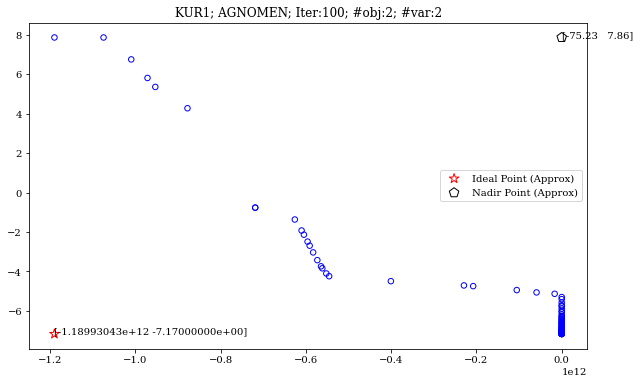

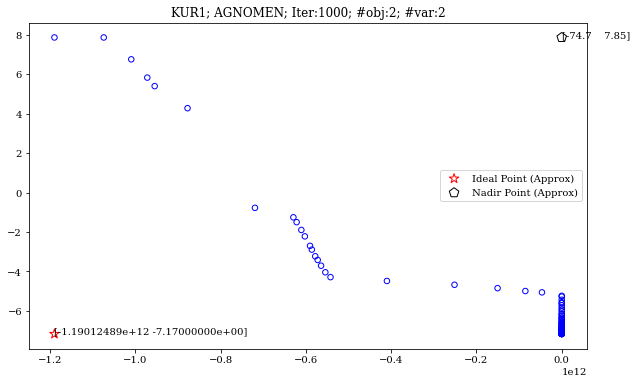

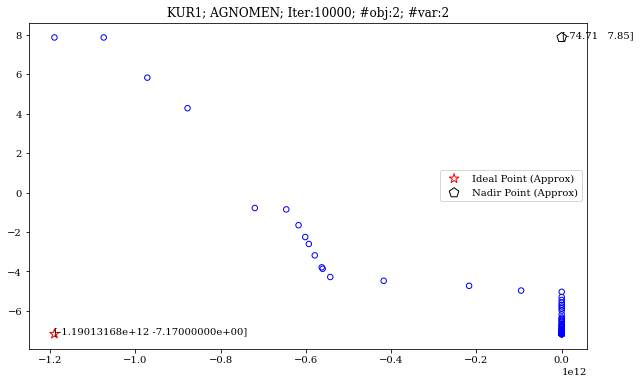

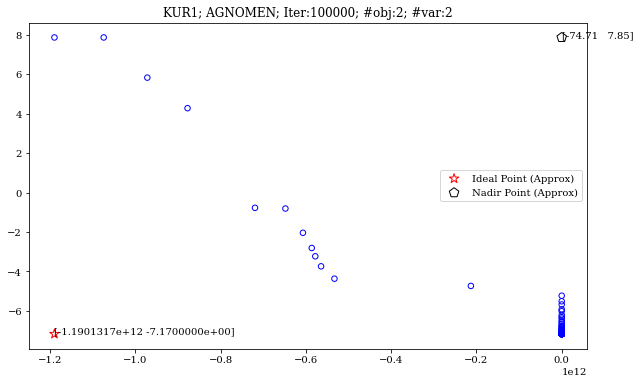

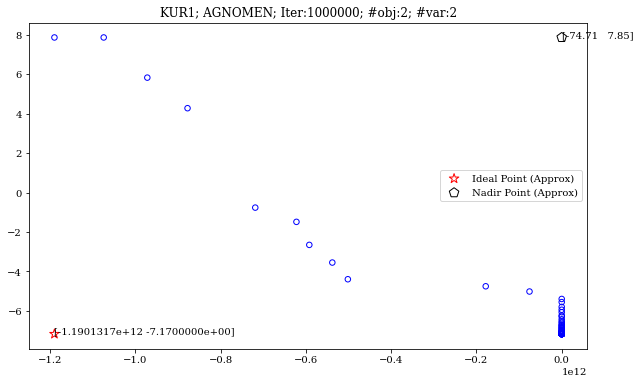

...

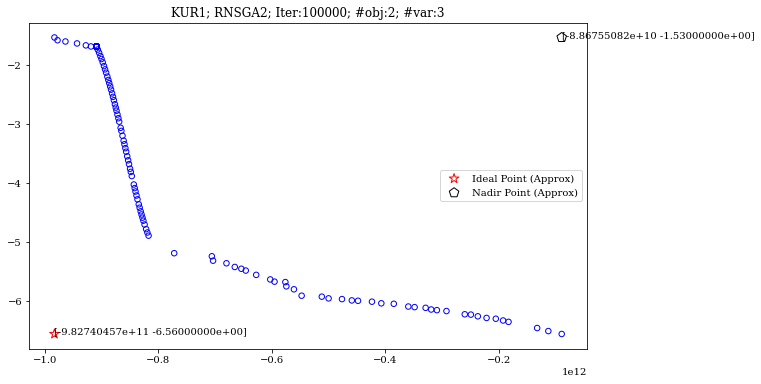

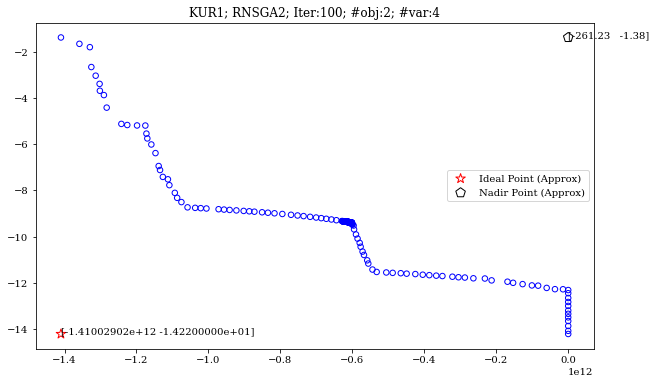

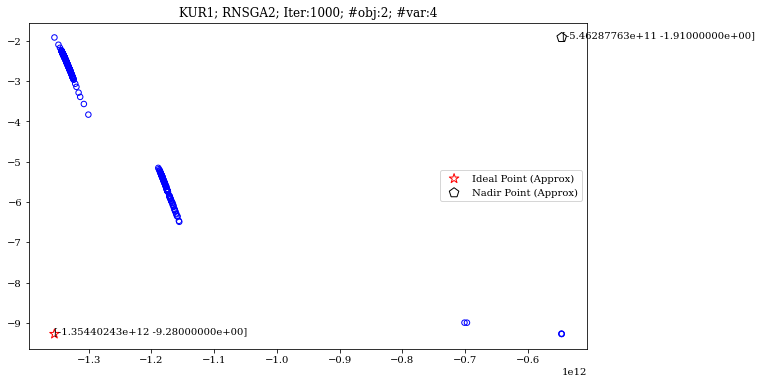

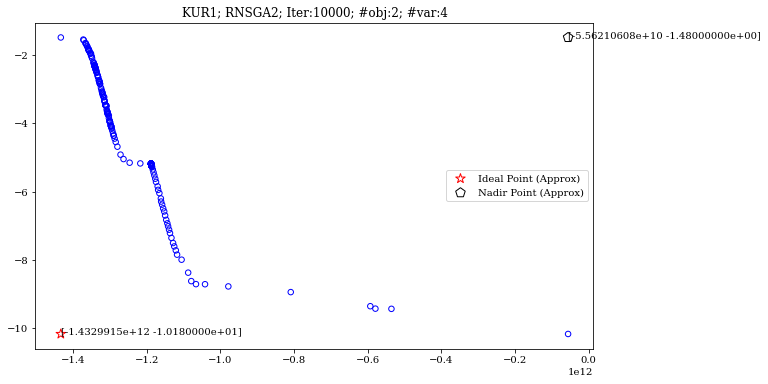

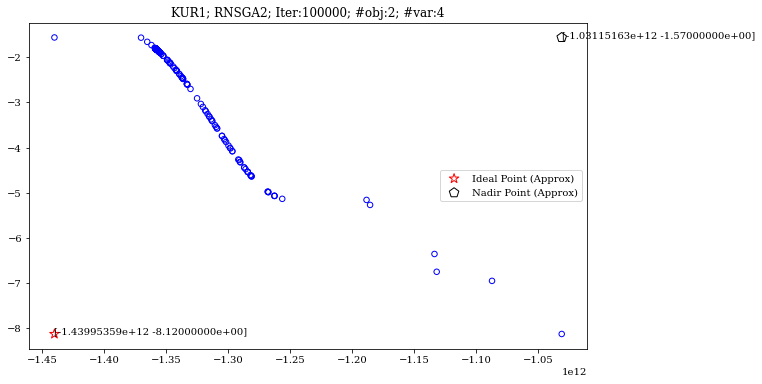

In [332]:
for i in range(len(kur1)):
    path = kur1['solution_path'][i]
    F = np.loadtxt(path)
    approx_ideal = F.min(axis=0)
    approx_nadir = F.max(axis=0)
    plt.figure(figsize=(10, 6))
    plt.text(approx_ideal[0], approx_ideal[1], str(np.round(approx_ideal,2)))
    plt.text(approx_nadir[0], approx_nadir[1], str(np.round(approx_nadir,2)))
    plt.scatter(F[:, 0], F[:, 1], s=30, facecolors='none', edgecolors='blue')
    plt.scatter(approx_ideal[0], approx_ideal[1], facecolors='none', edgecolors='red', marker="*", s=100, label="Ideal Point (Approx)")
    plt.scatter(approx_nadir[0], approx_nadir[1], facecolors='none', edgecolors='black', marker="p", s=100, label="Nadir Point (Approx)")
    plt.title(f"{kur1['Problem'][i]}; {kur1['Alg_name'][i]}; Iter:{kur1['Iteration'][i]}; #obj:{kur1['Objectives'][i]}; #var:{kur1['n_variables'][i]}")
    plt.legend()
    plt.show()


# LTDZ1

In [333]:
ltdz1 = splits[1][1].reset_index(drop=True)
ltdz1.loc[:,'ref_point'] = r"[5 5 5]"
ref_point = np.array([5,5,5])
ltdz1 = hv_result(ltdz1)

ltdz1
ltdz1_final = nadir_deal_point_result(ltdz1).drop(columns = 'solution_path')
ltdz1_final


,Problem,Alg_name,Iteration,Objectives,n_variables,exec_time,solutions,ref_point,hv,hv_exc_time,lower_bound,upper_bound,approx_ideal,approx_nadir
0,LTDZ1,AGNOMEN,100,3,3,3.887066,100,[5 5 5],511.403519,0.002869,[0 0 0],[1 1 1],"[-2.9999999999468283, -2.99999999994452, -2.99...","[-1.9484953012618684, -1.9379324702425373, -1...."
1,LTDZ1,AGNOMEN,1000,3,3,38.805707,100,[5 5 5],511.411784,0.002748,[0 0 0],[1 1 1],"[-3.0, -3.0, -3.0]","[-1.9759298341816875, -1.9624875569845333, -2.0]"
2,LTDZ1,AGNOMEN,10000,3,3,394.610409,100,[5 5 5],511.411552,0.002542,[0 0 0],[1 1 1],"[-3.0, -3.0, -3.0]","[-2.0000000000000053, -1.9727253739675683, -2.0]"
3,LTDZ1,AGNOMEN,100000,3,3,3887.793664,100,[5 5 5],511.414278,0.002612,[0 0 0],[1 1 1],"[-3.0, -3.0, -2.999999999997144]","[-2.0000000000009983, -1.8911449961231168, -2.0]"
4,LTDZ1,MOEAD,100,3,3,8.087659,100,[5 5 5],511.410946,0.002870,[0 0 0],[1 1 1],"[-2.9999988284250128, -2.999994276800835, -2.9...","[-1.9999803628374797, -1.999996648029959, -1.9..."
5,LTDZ1,MOEAD,1000,3,3,83.083789,100,[5 5 5],511.416246,0.002725,[0 0 0],[1 1 1],"[-3.0, -3.0, -3.0]","[-2.0, -2.0, -2.0]"
6,LTDZ1,MOEAD,10000,3,3,857.086366,100,[5 5 5],511.416247,0.002743,[0 0 0],[1 1 1],"[-3.0, -3.0, -3.0]","[-2.0, -2.0, -2.0]"
7,LTDZ1,MOEAD,100000,3,3,8545.119852,100,[5 5 5],511.416247,0.002580,[0 0 0],[1 1 1],"[-3.0, -3.0, -3.0]","[-2.0, -2.0, -2.0]"
8,LTDZ1,MOEAD,100000,3,3,8568.310682,100,[5 5 5],511.416247,0.002713,[0 0 0],[1 1 1],"[-3.0, -3.0, -3.0]","[-2.0, -2.0, -2.0]"
9,LTDZ1,NSGA2,100,3,3,2.667626,300,[5 5 5],511.368871,0.018465,[0 0 0],[1 1 1],"[-3.0, -3.0, -2.99999999999998]","[-1.9308946390063713, -1.8606194946695405, -1...."


#

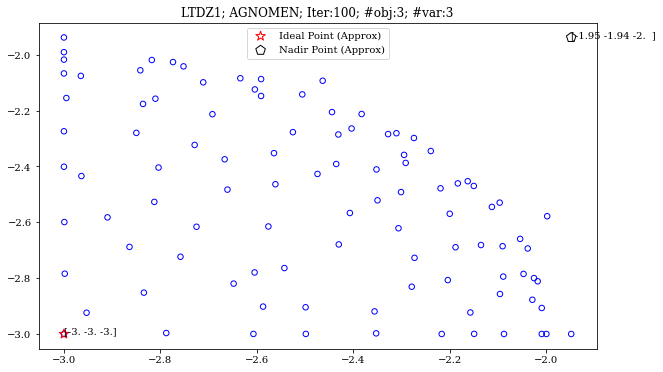

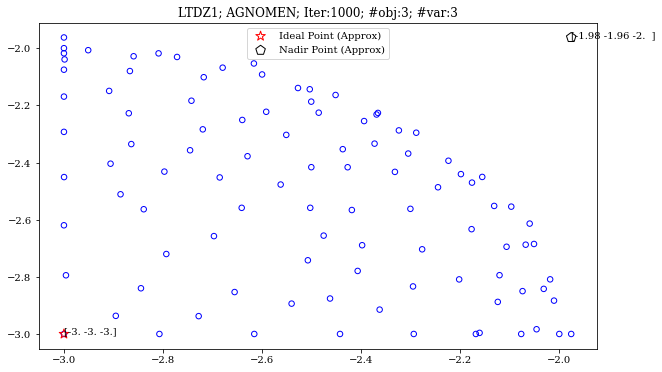

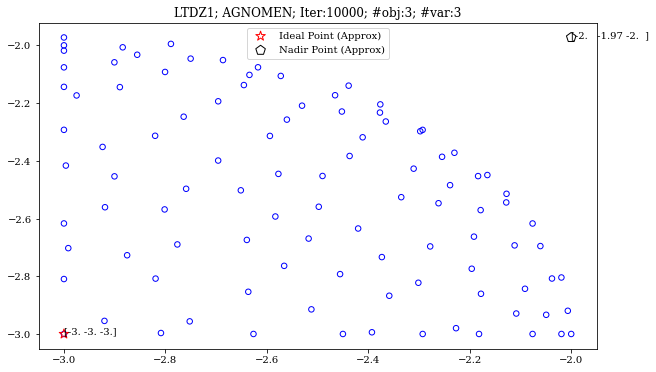

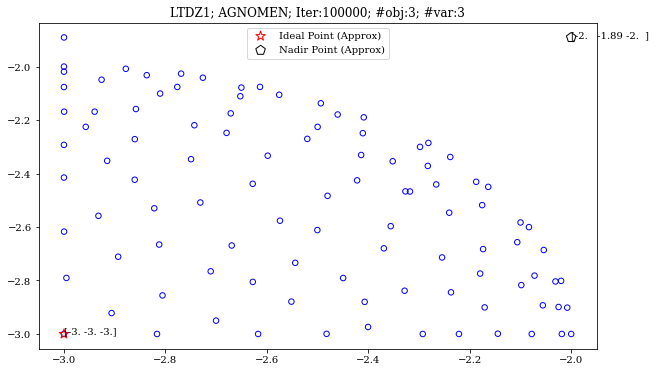

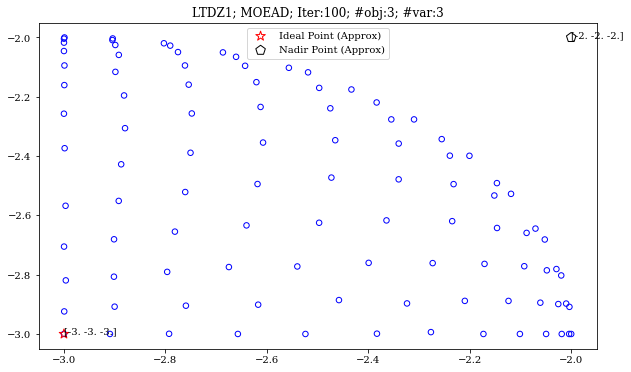

...

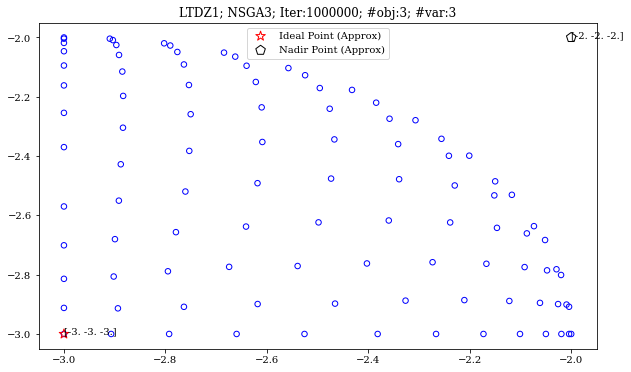

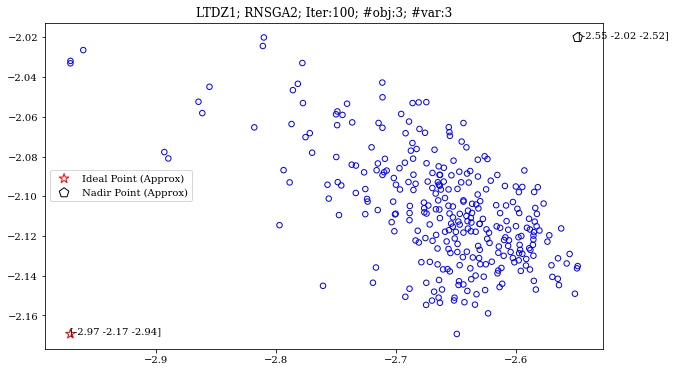

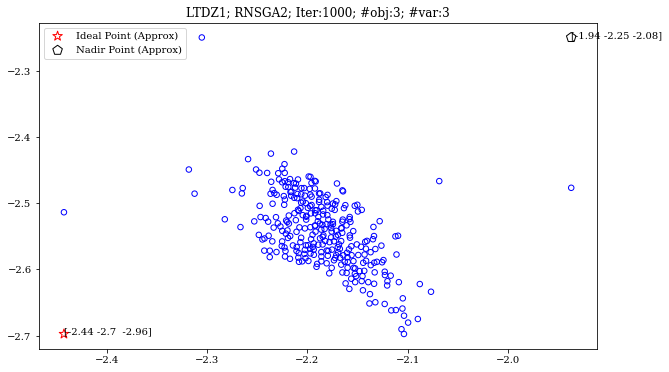

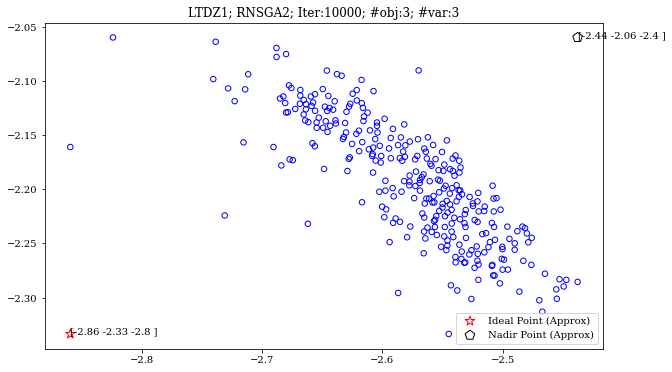

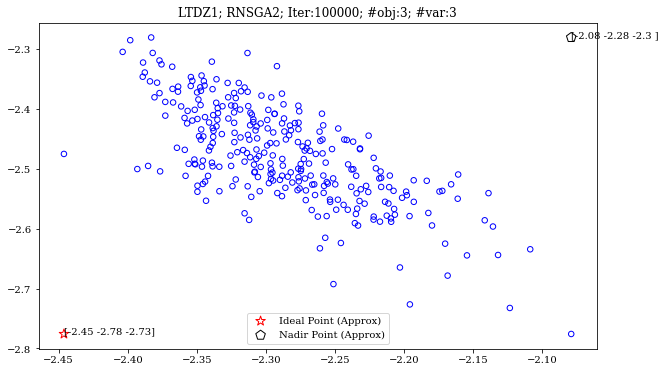

In [334]:
for i in range(len(ltdz1)):
    path = ltdz1['solution_path'][i]
    F = np.loadtxt(path)
    approx_ideal = F.min(axis=0)
    approx_nadir = F.max(axis=0)
    plt.figure(figsize=(10, 6))
    plt.text(approx_ideal[0], approx_ideal[1], str(np.round(approx_ideal,2)))
    plt.text(approx_nadir[0], approx_nadir[1], str(np.round(approx_nadir,2)))
    plt.scatter(F[:, 0], F[:, 1], s=30, facecolors='none', edgecolors='blue')
    plt.scatter(approx_ideal[0], approx_ideal[1], facecolors='none', edgecolors='red', marker="*", s=100, label="Ideal Point (Approx)")
    plt.scatter(approx_nadir[0], approx_nadir[1], facecolors='none', edgecolors='black', marker="p", s=100, label="Nadir Point (Approx)")
    plt.title(f"{ltdz1['Problem'][i]}; {ltdz1['Alg_name'][i]}; Iter:{ltdz1['Iteration'][i]}; #obj:{ltdz1['Objectives'][i]}; #var:{ltdz1['n_variables'][i]}")
    plt.legend()
    plt.show()


# SK2

In [335]:
sk2 = splits[2][1].reset_index(drop=True)

sk2.loc[:,'ref_point'] = r"[5 5]"

#step 1, initial ref_point
ref_point = np.array([5,5])
sk2 = hv_result(sk2)

#step 2, nadir ideal
sk2_final = nadir_deal_point_result(sk2).drop(columns = 'solution_path')
sk2_final

,Problem,Alg_name,Iteration,Objectives,n_variables,exec_time,solutions,ref_point,hv,hv_exc_time,lower_bound,upper_bound,approx_ideal,approx_nadir
0,SK2,AGNOMEN,100,2,4,1.866149,100,[5 5],62.617566,0.000576,[-10. -10. -10. -10.],[10. 10. 10. 10.],"[-4.997096795282785, -3.662542298807379]","[34.34190414710995, 0.6117201189978156]"
1,SK2,AGNOMEN,1000,2,4,20.964014,100,[5 5],62.681521,0.000589,[-10. -10. -10. -10.],[10. 10. 10. 10.],"[-4.999999529203025, -3.663160185024713]","[34.13382015809481, 0.6148082181025608]"
2,SK2,AGNOMEN,10000,2,4,253.384184,100,[5 5],62.646885,0.000381,[-10. -10. -10. -10.],[10. 10. 10. 10.],"[-4.99999999986264, -3.663161970755306]","[34.1515441260932, 0.6152891307355915]"
3,SK2,AGNOMEN,100000,2,4,2113.493664,100,[5 5],62.699910,0.000364,[-10. -10. -10. -10.],[10. 10. 10. 10.],"[-4.999999999999183, -3.663161971501489]","[34.151850508691886, 0.6152920568381365]"
4,SK2,AGNOMEN,1000000,2,4,21182.920693,100,[5 5],62.651603,0.000528,[-10. -10. -10. -10.],[10. 10. 10. 10.],"[-4.999999999999994, -3.663161971502453]","[34.15184964933682, 0.615291830027937]"
5,SK2,MOEAD,100,2,4,7.053319,100,[5 5],62.828263,0.000625,[-10. -10. -10. -10.],[10. 10. 10. 10.],"[-4.980967008603031, -3.0375719697025025]","[13.16521599288346, 0.6502703674522108]"
6,SK2,MOEAD,1000,2,4,81.054026,100,[5 5],62.969085,0.000516,[-10. -10. -10. -10.],[10. 10. 10. 10.],"[-4.998820363425218, -3.127314126542042]","[16.355847976493806, 0.6250158102131033]"
7,SK2,MOEAD,10000,2,4,748.353042,100,[5 5],62.992563,0.000474,[-10. -10. -10. -10.],[10. 10. 10. 10.],"[-4.999999877236251, -3.6631603265875037]","[34.137445256316525, 0.6150391810572263]"
8,SK2,MOEAD,100000,2,4,7374.744020,100,[5 5],62.998240,0.000477,[-10. -10. -10. -10.],[10. 10. 10. 10.],"[-4.999999999307351, -3.6631619698120614]","[34.151274080838725, 0.6153046653125147]"
9,SK2,NSGA2,100,2,4,1.849775,300,[5 5],62.992975,0.001256,[-10. -10. -10. -10.],[10. 10. 10. 10.],"[-4.995978240527677, -3.6622759799703815]","[34.107086741428986, 0.5713445204098914]"


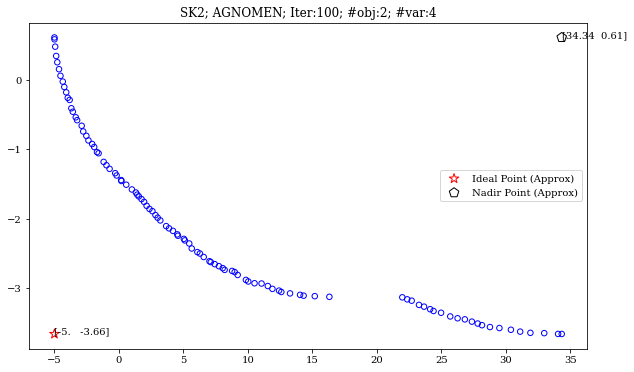

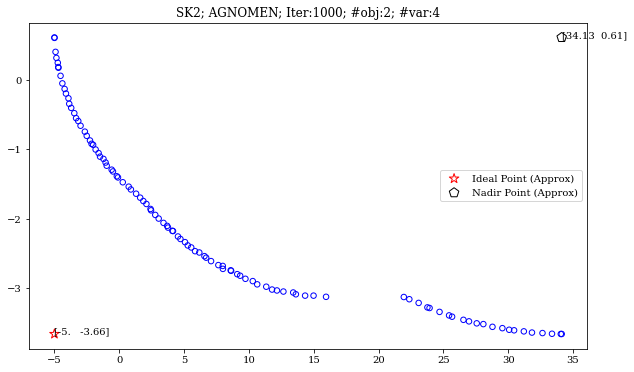

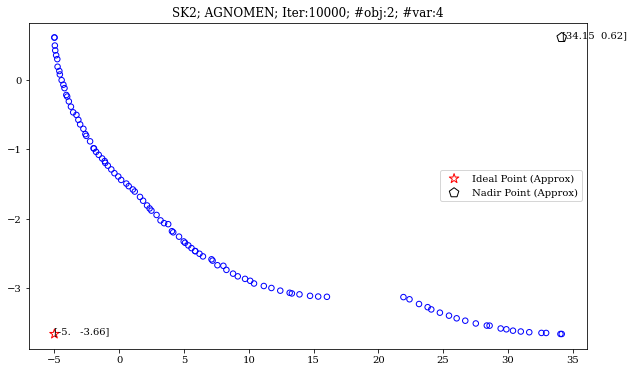

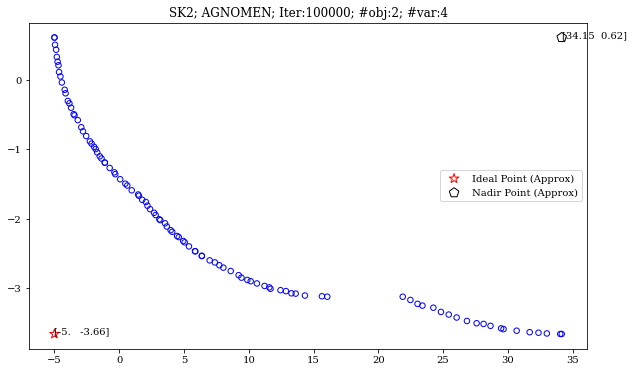

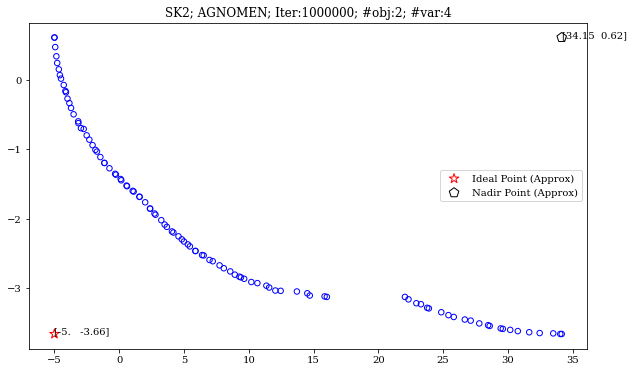

...

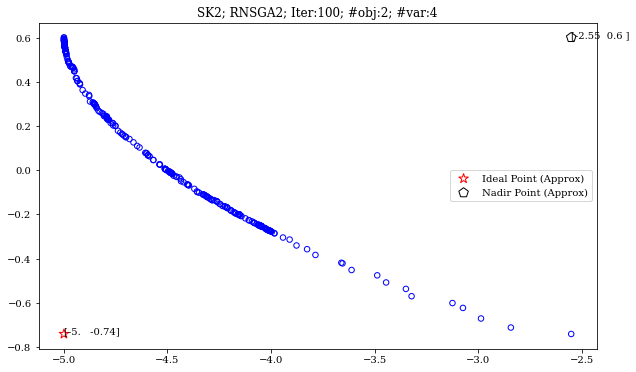

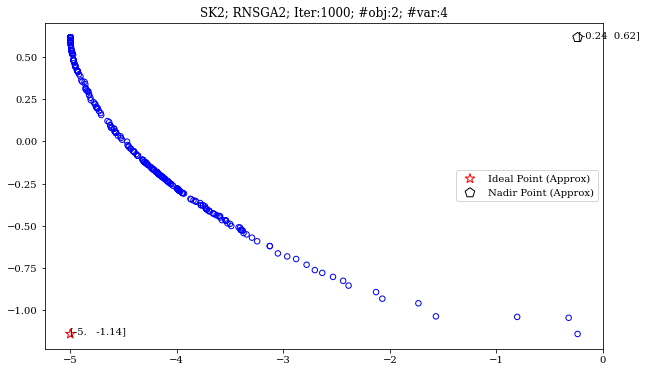

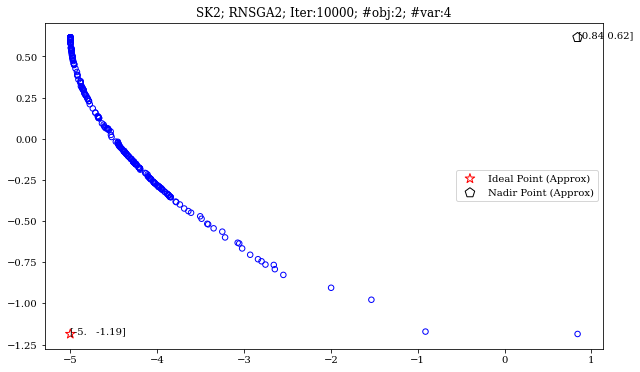

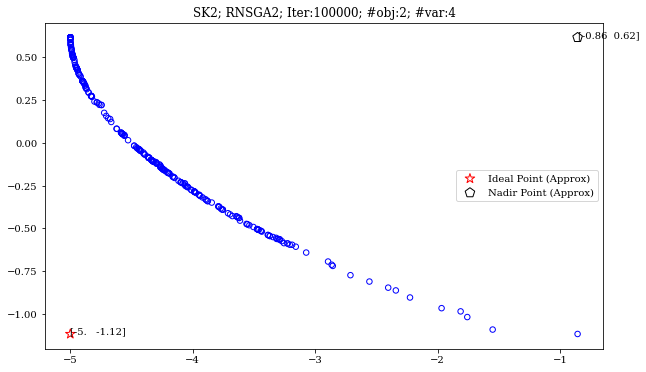

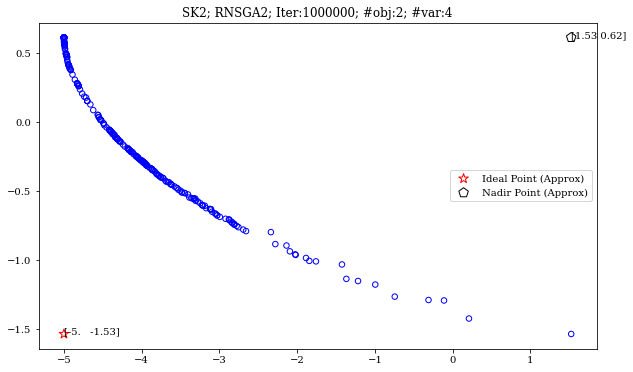

In [336]:
for i in range(len(sk2)):
    path = sk2['solution_path'][i]
    F = np.loadtxt(path)
    approx_ideal = F.min(axis=0)
    approx_nadir = F.max(axis=0)
    plt.figure(figsize=(10, 6))
    plt.text(approx_ideal[0], approx_ideal[1], str(np.round(approx_ideal,2)))
    plt.text(approx_nadir[0], approx_nadir[1], str(np.round(approx_nadir,2)))
    plt.scatter(F[:, 0], F[:, 1], s=30, facecolors='none', edgecolors='blue')
    plt.scatter(approx_ideal[0], approx_ideal[1], facecolors='none', edgecolors='red', marker="*", s=100, label="Ideal Point (Approx)")
    plt.scatter(approx_nadir[0], approx_nadir[1], facecolors='none', edgecolors='black', marker="p", s=100, label="Nadir Point (Approx)")
    plt.title(f"{sk2['Problem'][i]}; {sk2['Alg_name'][i]}; Iter:{sk2['Iteration'][i]}; #obj:{sk2['Objectives'][i]}; #var:{sk2['n_variables'][i]}")
    plt.legend()
    plt.show()

# TKLY1

In [337]:


tkly1 = splits[3][1].reset_index(drop=True)

tkly1.loc[:,'ref_point'] = r"[5 5]"

#step 1, initial ref_point
ref_point = np.array([5,5])
tkly1 = hv_result(tkly1)

#step 2, nadir ideal
tkly1_final = nadir_deal_point_result(tkly1).drop(columns = 'solution_path')
tkly1_final

,Problem,Alg_name,Iteration,Objectives,n_variables,exec_time,solutions,ref_point,hv,hv_exc_time,lower_bound,upper_bound,approx_ideal,approx_nadir
0,TKLY1,AGNOMEN,100,2,4,2.275373,100,[5 5],16.083558,0.000454,[0.1 0. 0. 0. ],[1 1 1 1],"[0.10000000000001452, 1.419642592941136]","[0.9999298253687475, 14.193284810908796]"
1,TKLY1,AGNOMEN,1000,2,4,25.667208,100,[5 5],16.091697,0.000584,[0.1 0. 0. 0. ],[1 1 1 1],"[0.1, 1.4189003849506856]","[0.9999999220613879, 14.189002687567617]"
2,TKLY1,AGNOMEN,10000,2,4,256.785134,100,[5 5],16.092069,0.000418,[0.1 0. 0. 0. ],[1 1 1 1],"[0.1, 1.4189002613981032]","[0.9999999992500246, 14.18900260333961]"
3,TKLY1,AGNOMEN,100000,2,4,2585.511240,100,[5 5],16.089919,0.000496,[0.1 0. 0. 0. ],[1 1 1 1],"[0.1, 1.4189002603340255]","[0.9999999999999547, 14.18900260333961]"
4,TKLY1,AGNOMEN,1000000,2,4,25172.901927,100,[5 5],16.091518,0.000475,[0.1 0. 0. 0. ],[1 1 1 1],"[0.1, 1.4189002980203975]","[0.9999999784624638, 14.18900260333961]"
5,TKLY1,AGNOMEN,1000000,2,4,25989.847696,100,[5 5],16.091518,0.000559,[0.1 0. 0. 0. ],[1 1 1 1],"[0.1, 1.4189002980203975]","[0.9999999784624638, 14.18900260333961]"
6,TKLY1,MOEAD,100,2,4,7.160897,100,[5 5],14.505207,0.000566,[0.1 0. 0. 0. ],[1 1 1 1],"[0.12469664435906454, 1.7282040331264692]","[0.9999444651088989, 13.870205403369367]"
7,TKLY1,MOEAD,1000,2,4,87.142336,100,[5 5],14.507115,0.000623,[0.1 0. 0. 0. ],[1 1 1 1],"[0.10000000000003255, 1.728001248798578]","[0.9999992832909874, 17.680975229872416]"
8,TKLY1,MOEAD,10000,2,4,717.450754,100,[5 5],14.507142,0.000648,[0.1 0. 0. 0. ],[1 1 1 1],"[0.1, 1.728000000000008]","[0.9999999999999992, 17.56730046442188]"
9,TKLY1,MOEAD,100000,2,4,7317.898430,100,[5 5],14.507142,0.000542,[0.1 0. 0. 0. ],[1 1 1 1],"[0.1, 1.728]","[1.0, 17.56730046442188]"


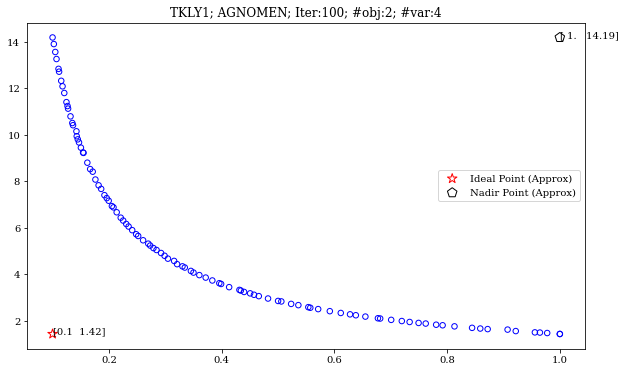

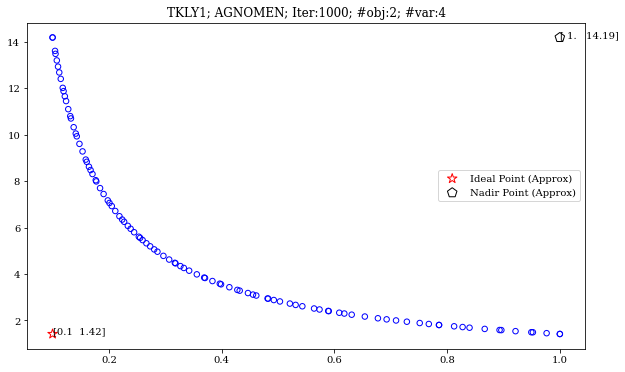

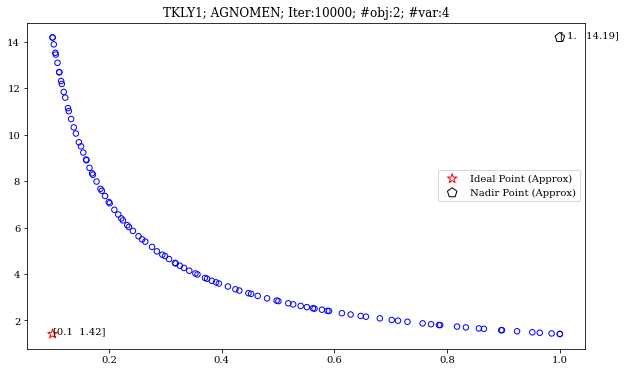

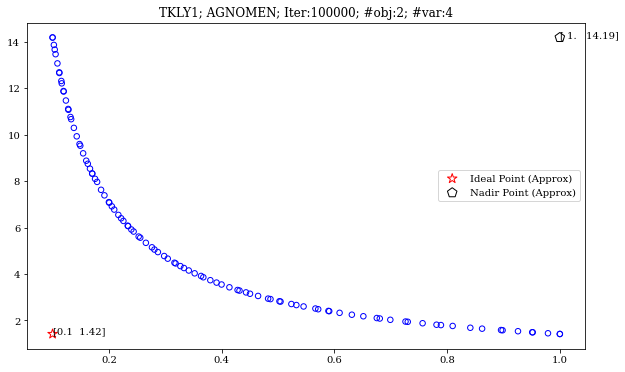

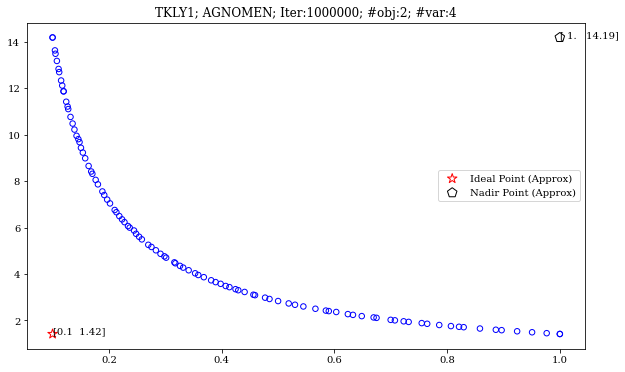

...

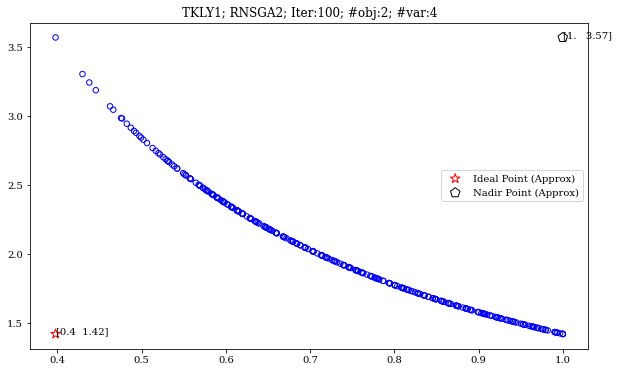

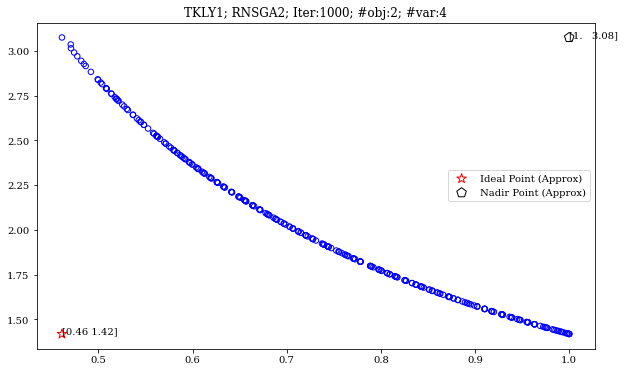

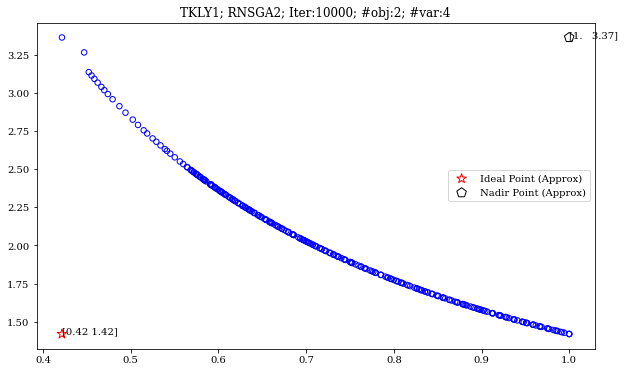

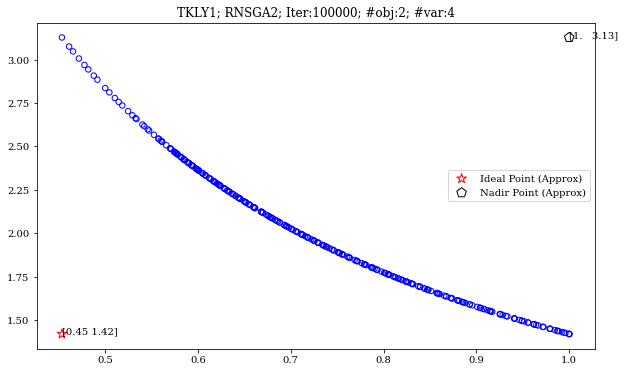

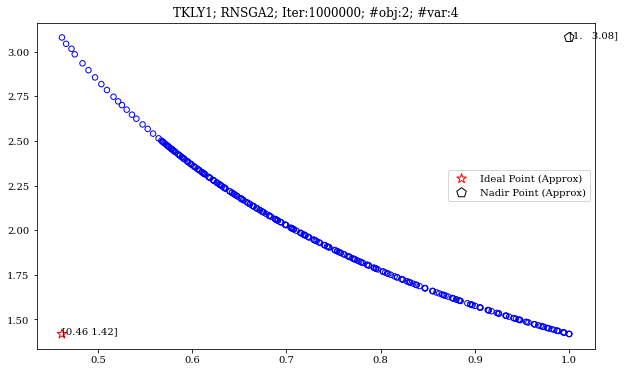

In [338]:
for i in range(len(tkly1)):
    path = tkly1['solution_path'][i]
    F = np.loadtxt(path)
    approx_ideal = F.min(axis=0)
    approx_nadir = F.max(axis=0)
    plt.figure(figsize=(10, 6))
    plt.text(approx_ideal[0], approx_ideal[1], str(np.round(approx_ideal,2)))
    plt.text(approx_nadir[0], approx_nadir[1], str(np.round(approx_nadir,2)))
    plt.scatter(F[:, 0], F[:, 1], s=30, facecolors='none', edgecolors='blue')
    plt.scatter(approx_ideal[0], approx_ideal[1], facecolors='none', edgecolors='red', marker="*", s=100, label="Ideal Point (Approx)")
    plt.scatter(approx_nadir[0], approx_nadir[1], facecolors='none', edgecolors='black', marker="p", s=100, label="Nadir Point (Approx)")
    plt.title(f"{tkly1['Problem'][i]}; {tkly1['Alg_name'][i]}; Iter:{tkly1['Iteration'][i]}; #obj:{tkly1['Objectives'][i]}; #var:{tkly1['n_variables'][i]}")
    plt.legend()
    plt.show()

# VU1

In [339]:

vu1 = splits[4][1].reset_index(drop=True)

vu1.loc[:,'ref_point'] = r"[5 5]"

#step 1, initial ref_point
ref_point = np.array([5,5])
vu1 = hv_result(vu1)

#step 2, nadir ideal
vu1_final = nadir_deal_point_result(vu1).drop(columns = 'solution_path')
vu1_final

,Problem,Alg_name,Iteration,Objectives,n_variables,exec_time,solutions,ref_point,hv,hv_exc_time,lower_bound,upper_bound,approx_ideal,approx_nadir
0,VU1,AGNOMEN,100,2,2,2.994393,100,[5 5],18.352053,0.000407,[-3 -3],[3 3],"[0.05263157897051964, 1.0000105128807124]","[0.9999927233303154, 36.99999997492776]"
1,VU1,AGNOMEN,1000,2,2,37.803936,100,[5 5],18.353165,0.000522,[-3 -3],[3 3],"[0.05263157894736842, 1.0000000842986814]","[0.9999999162501901, 37.0]"
2,VU1,AGNOMEN,10000,2,2,306.555956,100,[5 5],18.348268,0.000355,[-3 -3],[3 3],"[0.05263157894736842, 1.000000000001257]","[0.9999999999994729, 37.0]"
3,VU1,AGNOMEN,100000,2,2,3082.413879,100,[5 5],18.348837,0.000337,[-3 -3],[3 3],"[0.05263157894736842, 1.0000000000000013]","[0.9999999999999987, 37.0]"
4,VU1,AGNOMEN,1000000,2,2,30298.064927,100,[5 5],18.351319,0.000408,[-3 -3],[3 3],"[0.05263157894736842, 1.0000000000000004]","[0.9999999999999996, 37.0]"
5,VU1,AGNOMEN,1000000,2,2,30194.381822,100,[5 5],18.351319,0.000421,[-3 -3],[3 3],"[0.05263157894736842, 1.0000000000000004]","[0.9999999999999996, 37.0]"
6,VU1,MOEAD,100,2,2,7.160943,100,[5 5],18.361187,0.000581,[-3 -3],[3 3],"[0.05271262224429597, 1.0008913453736725]","[0.9993497587095913, 36.91612507193808]"
7,VU1,MOEAD,1000,2,2,77.864348,100,[5 5],18.366057,0.000612,[-3 -3],[3 3],"[0.05263157894737387, 1.0000076135243614]","[0.9999974481715316, 36.99999999999457]"
8,VU1,MOEAD,10000,2,2,756.652200,100,[5 5],18.366244,0.000595,[-3 -3],[3 3],"[0.05263157894736842, 1.0000000048346693]","[0.9999999951653307, 37.0]"
9,VU1,MOEAD,100000,2,2,7550.910868,100,[5 5],18.366252,0.000542,[-3 -3],[3 3],"[0.05263157894736842, 1.0000000000008034]","[0.9999999999991966, 37.0]"


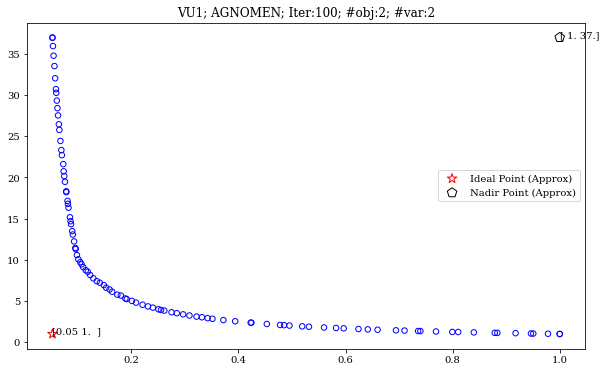

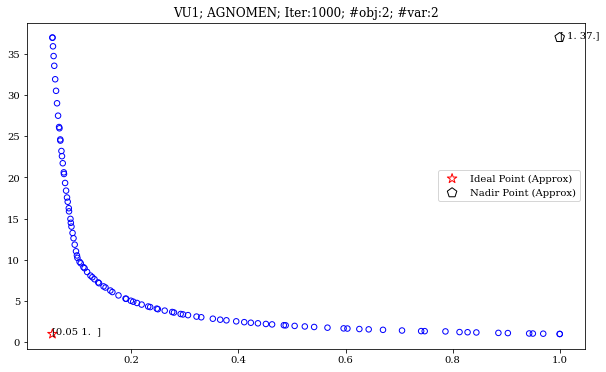

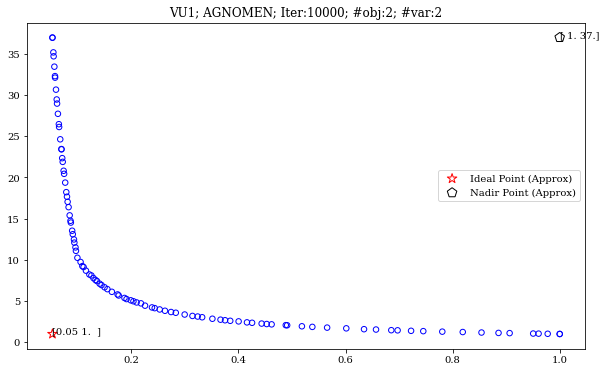

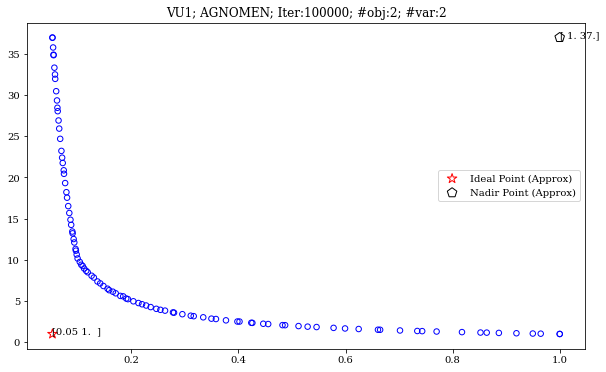

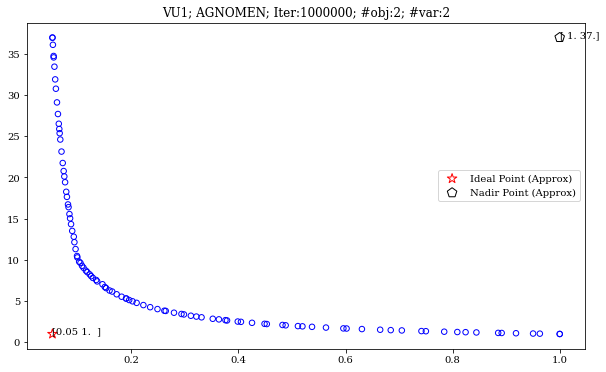

...

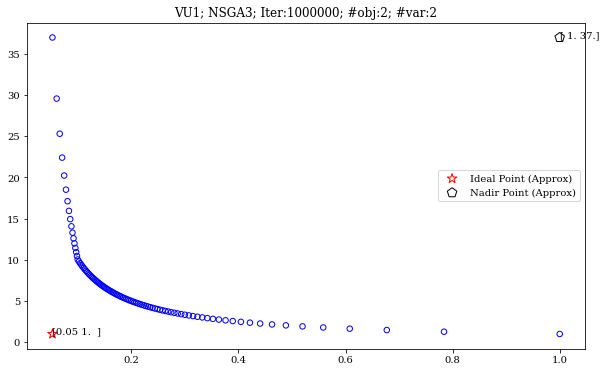

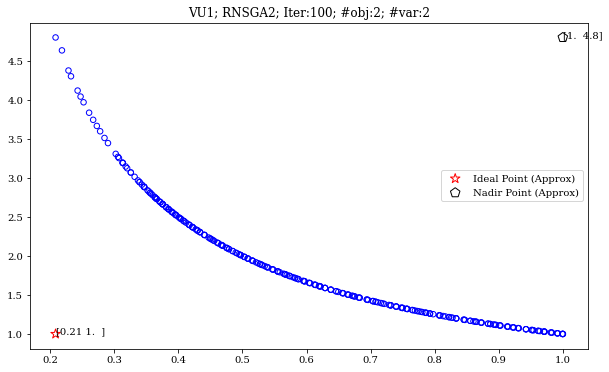

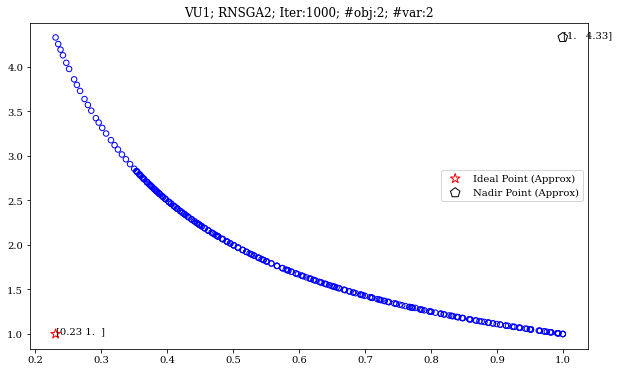

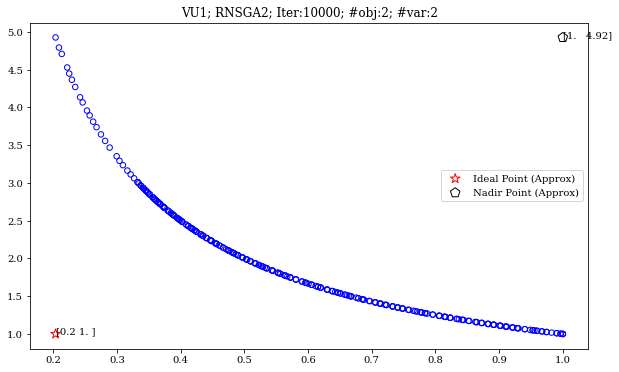

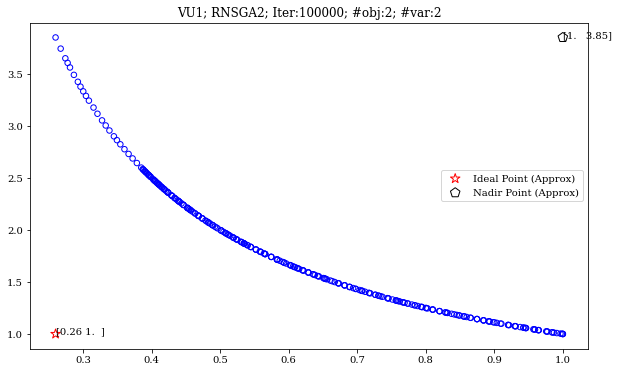

In [340]:
for i in range(len(vu1)):
    path = vu1['solution_path'][i]
    F = np.loadtxt(path)
    approx_ideal = F.min(axis=0)
    approx_nadir = F.max(axis=0)
    plt.figure(figsize=(10, 6))
    plt.text(approx_ideal[0], approx_ideal[1], str(np.round(approx_ideal,2)))
    plt.text(approx_nadir[0], approx_nadir[1], str(np.round(approx_nadir,2)))
    plt.scatter(F[:, 0], F[:, 1], s=30, facecolors='none', edgecolors='blue')
    plt.scatter(approx_ideal[0], approx_ideal[1], facecolors='none', edgecolors='red', marker="*", s=100, label="Ideal Point (Approx)")
    plt.scatter(approx_nadir[0], approx_nadir[1], facecolors='none', edgecolors='black', marker="p", s=100, label="Nadir Point (Approx)")
    plt.title(f"{vu1['Problem'][i]}; {vu1['Alg_name'][i]}; Iter:{vu1['Iteration'][i]}; #obj:{vu1['Objectives'][i]}; #var:{vu1['n_variables'][i]}")
    plt.legend()
    plt.show()

# VU2

In [341]:

vu2 = splits[5][1].reset_index(drop=True)

vu2.loc[:,'ref_point'] = r"[5 5]"

#step 1, initial ref_point
ref_point = np.array([5,5])
vu2 = hv_result(vu2)

#step 2, nadir ideal
vu2_final = nadir_deal_point_result(vu2).drop(columns = 'solution_path')
vu2_final

,Problem,Alg_name,Iteration,Objectives,n_variables,exec_time,solutions,ref_point,hv,hv_exc_time,lower_bound,upper_bound,approx_ideal,approx_nadir
0,VU2,AGNOMEN,100,2,2,3.012567,100,[5 5],110.850006,0.000705,[-3 -3],[3 3],"[-4.999999999254824, -6.999999522752367]","[-1.9993091688822444, 1.9999999958476335]"
1,VU2,AGNOMEN,1000,2,2,34.093646,100,[5 5],110.841423,0.000585,[-3 -3],[3 3],"[-5.0, -6.999999999952334]","[-2.000006904021043, 1.9999999999999982]"
2,VU2,AGNOMEN,10000,2,2,342.933247,100,[5 5],110.840447,0.000606,[-3 -3],[3 3],"[-5.0, -6.999999999999961]","[-2.0000001984519087, 1.9999999999999982]"
3,VU2,AGNOMEN,100000,2,2,3518.744086,100,[5 5],110.841328,0.000617,[-3 -3],[3 3],"[-5.0, -6.999999999999997]","[-1.9999999502337569, 1.9999999999999982]"
4,VU2,AGNOMEN,1000000,2,2,34245.245919,100,[5 5],110.841738,0.000604,[-3 -3],[3 3],"[-5.0, -7.0]","[-2.000000018607494, 1.9999999999999982]"
5,VU2,MOEAD,100,2,2,7.179388,100,[5 5],110.804625,0.000570,[-3 -3],[3 3],"[-4.999947209250532, -6.999997016114287]","[-2.001281945732103, 1.9996937449379022]"
6,VU2,MOEAD,1000,2,2,72.594715,100,[5 5],110.804856,0.000606,[-3 -3],[3 3],"[-5.0, -6.999999984810622]","[-2.0001232451930258, 2.0]"
7,VU2,MOEAD,10000,2,2,725.437804,100,[5 5],110.804833,0.000586,[-3 -3],[3 3],"[-5.0, -6.999999999988954]","[-1.9999966764007326, 2.0]"
8,VU2,MOEAD,100000,2,2,7194.906859,100,[5 5],110.804833,0.000672,[-3 -3],[3 3],"[-5.0, -6.999999999995079]","[-2.0000022184097355, 2.0]"
9,VU2,NSGA2,100,2,2,2.084600,300,[5 5],110.948544,0.002302,[-3 -3],[3 3],"[-4.999999999897714, -6.999998666066376]","[-2.0011549360853786, 1.9999999993867563]"


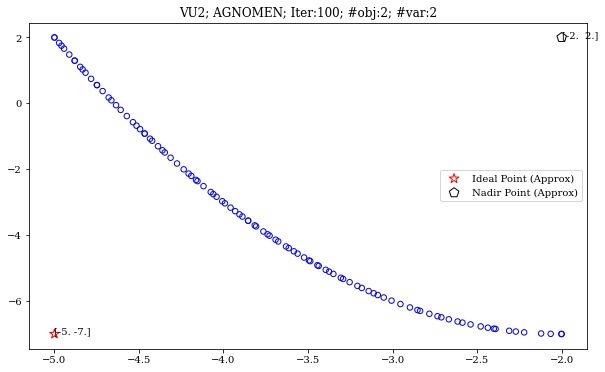

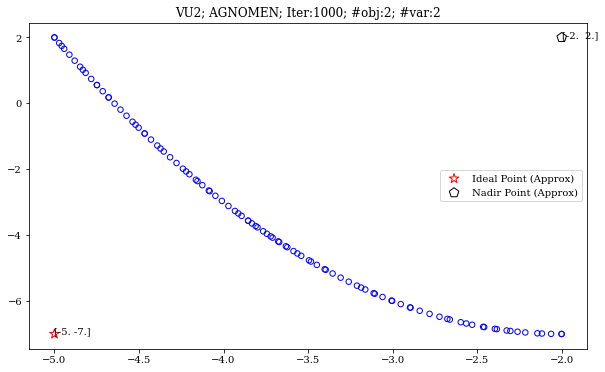

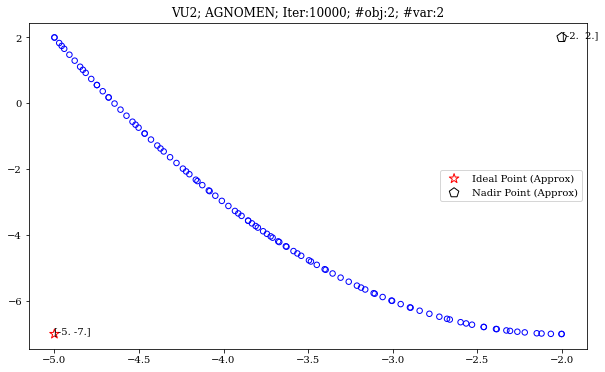

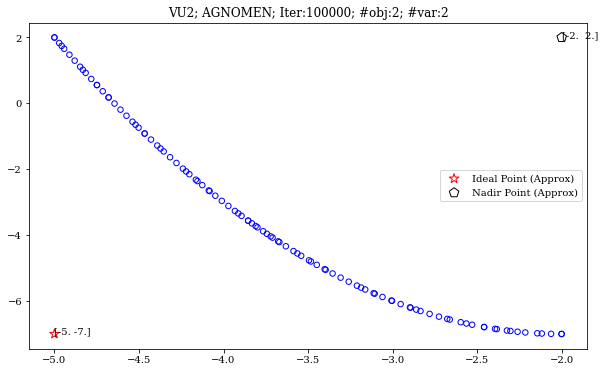

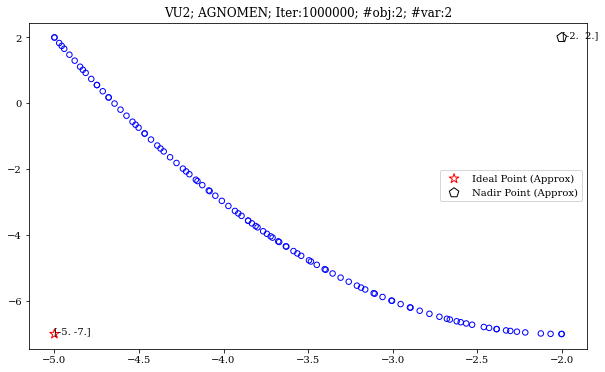

...

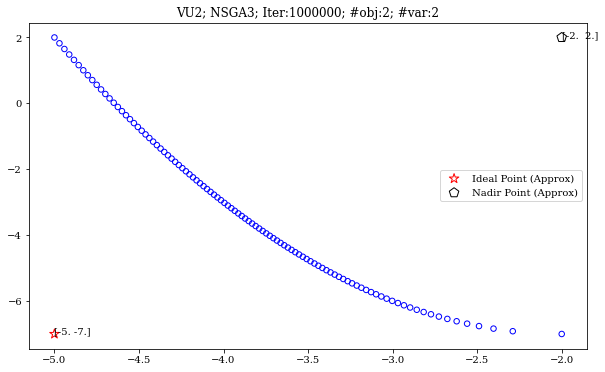

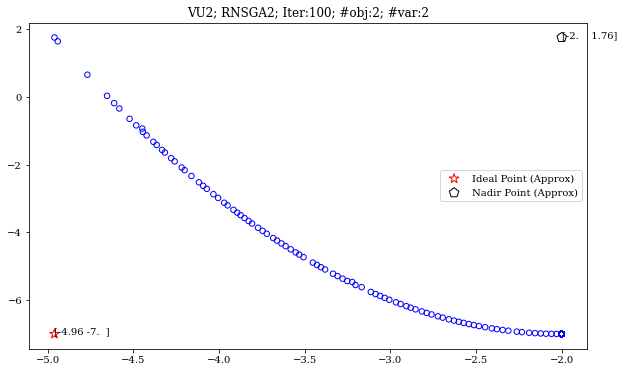

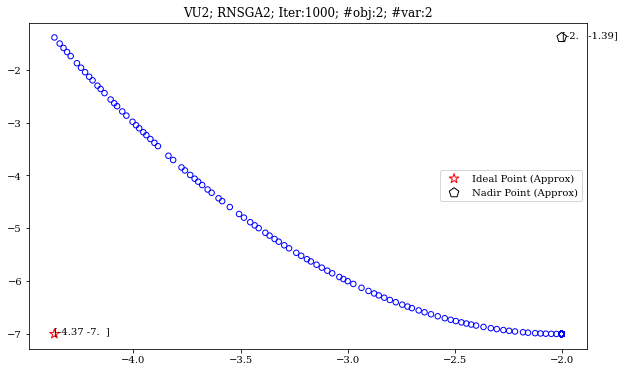

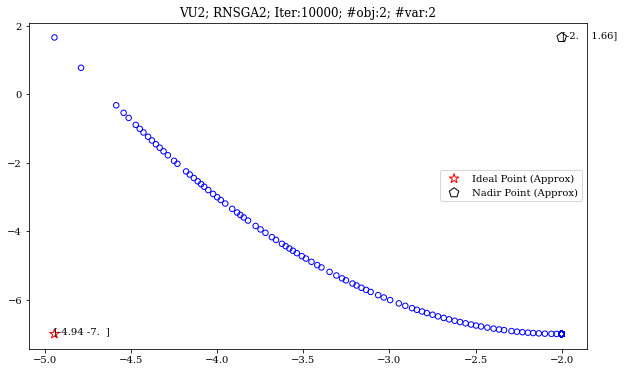

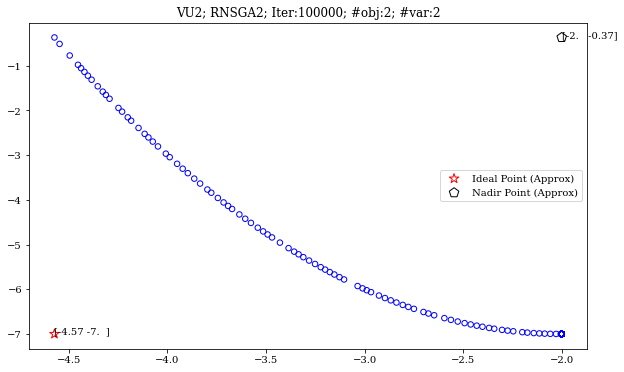

In [342]:
for i in range(len(vu2)):
    path = vu2['solution_path'][i]
    F = np.loadtxt(path)
    approx_ideal = F.min(axis=0)
    approx_nadir = F.max(axis=0)
    plt.figure(figsize=(10, 6))
    plt.text(approx_ideal[0], approx_ideal[1], str(np.round(approx_ideal,2)))
    plt.text(approx_nadir[0], approx_nadir[1], str(np.round(approx_nadir,2)))
    plt.scatter(F[:, 0], F[:, 1], s=30, facecolors='none', edgecolors='blue')
    plt.scatter(approx_ideal[0], approx_ideal[1], facecolors='none', edgecolors='red', marker="*", s=100, label="Ideal Point (Approx)")
    plt.scatter(approx_nadir[0], approx_nadir[1], facecolors='none', edgecolors='black', marker="p", s=100, label="Nadir Point (Approx)")
    plt.title(f"{vu2['Problem'][i]}; {vu2['Alg_name'][i]}; Iter:{vu2['Iteration'][i]}; #obj:{vu2['Objectives'][i]}; #var:{vu2['n_variables'][i]}")
    plt.legend()
    plt.show()

# ZDT1

In [343]:

zdt1 = splits[6][1].reset_index(drop=True)

zdt1.loc[:,'ref_point'] = r"[5 5]"

#step 1, initial ref_point
ref_point = np.array([5,5])
zdt1 = hv_result(zdt1)

#step 2, nadir ideal
zdt1_final = nadir_deal_point_result(zdt1).drop(columns = 'solution_path')
zdt1_final

,Problem,Alg_name,Iteration,Objectives,n_variables,exec_time,solutions,ref_point,hv,hv_exc_time,lower_bound,upper_bound,approx_ideal,approx_nadir
0,ZDT1,AGNOMEN,100,2,10,1.796660,100,[5 5],24.658177,0.000686,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[1.1741477320876233e-08, 0.0004668446508686806]","[0.9998190877645556, 1.0006473395092372]"
1,ZDT1,AGNOMEN,1000,2,10,25.373875,100,[5 5],24.660834,0.000575,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[0.0, 9.602385109275247e-08]","[0.9999998079523071, 1.0]"
2,ZDT1,AGNOMEN,10000,2,10,284.452909,100,[5 5],24.660975,0.000539,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[0.0, 4.286954170540369e-07]","[0.9999991426093496, 1.0]"
3,ZDT1,AGNOMEN,100000,2,10,2931.515165,100,[5 5],24.661227,0.000605,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[0.0, 1.0192512052142888e-06]","[0.9999979614986284, 1.0]"
4,ZDT1,AGNOMEN,1000000,2,10,30630.386547,100,[5 5],24.660992,0.000638,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[0.0, 3.042454223001201e-07]","[0.9999993915092479, 1.0]"
5,ZDT1,AGNOMEN,1000000,2,10,32201.265505,100,[5 5],24.660992,0.000657,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[0.0, 3.042454223001201e-07]","[0.9999993915092479, 1.0]"
6,ZDT1,AGNOMEN,100,2,20,1.646897,100,[5 5],24.633321,0.000605,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...,[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. ...,"[7.990068097394453e-07, 0.004917013156394754]","[0.9973959522197059, 1.0093192372129838]"
7,ZDT1,AGNOMEN,1000,2,20,24.586210,100,[5 5],24.661107,0.000596,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...,[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. ...,"[5.4454113670088564e-17, 1.7626329813936439e-07]","[0.9999996478759647, 0.99999999274657]"
8,ZDT1,AGNOMEN,10000,2,20,264.592746,100,[5 5],24.661096,0.000565,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...,[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. ...,"[5.4454113670088564e-17, 2.2462992692600368e-06]","[0.9999955079009624, 0.9999999926206969]"
9,ZDT1,AGNOMEN,100000,2,20,2802.459158,100,[5 5],24.661049,0.000562,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...,[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. ...,"[5.4454113670088564e-17, 3.062141618705534e-08]","[0.9999999389716566, 0.9999999926206969]"


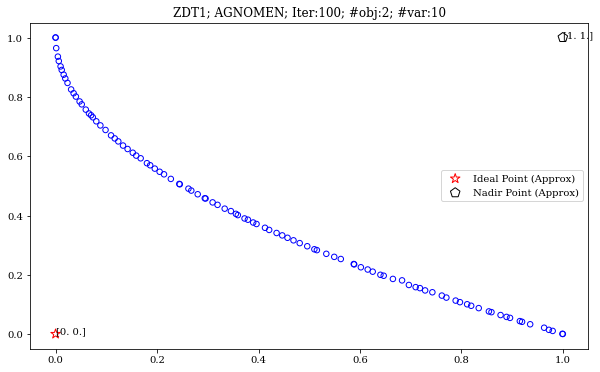

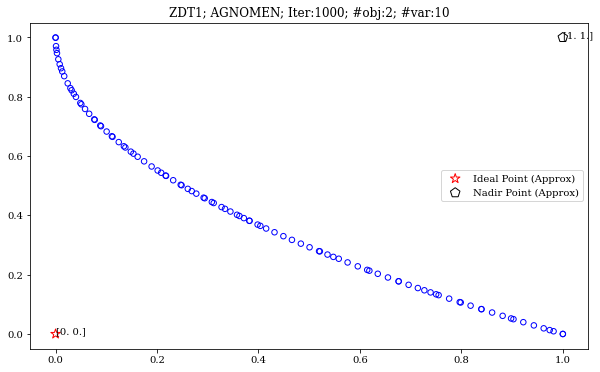

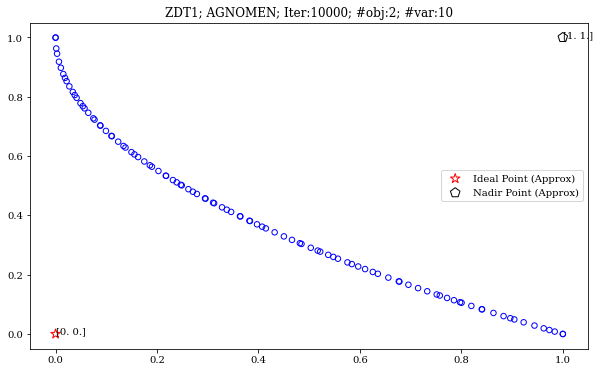

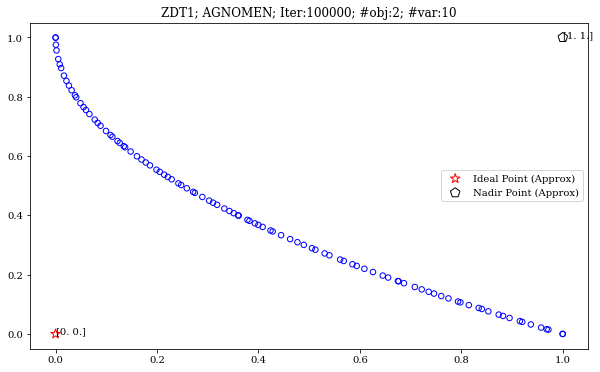

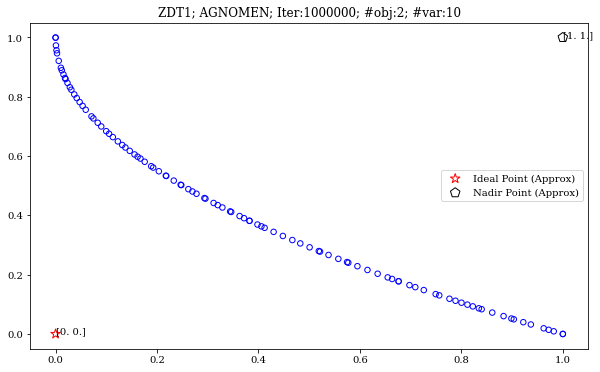

...

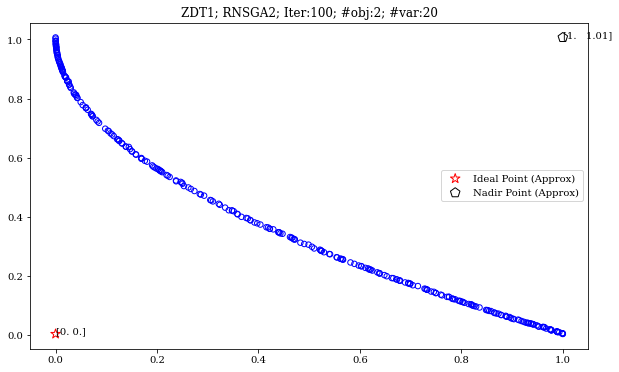

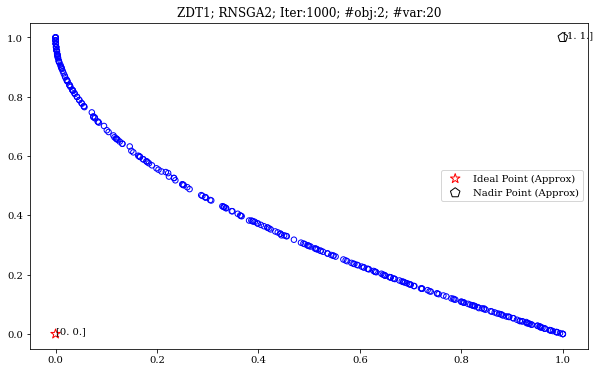

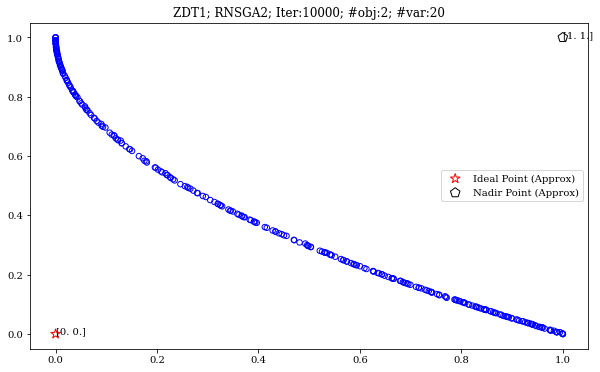

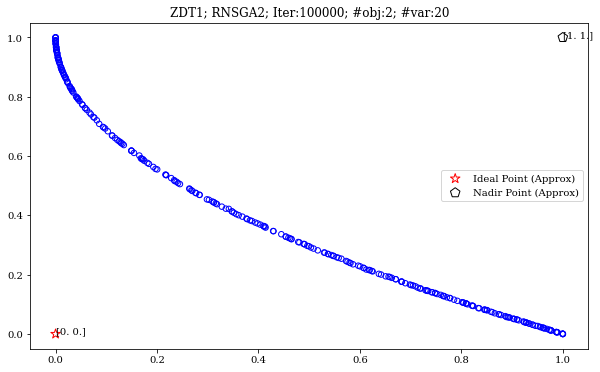

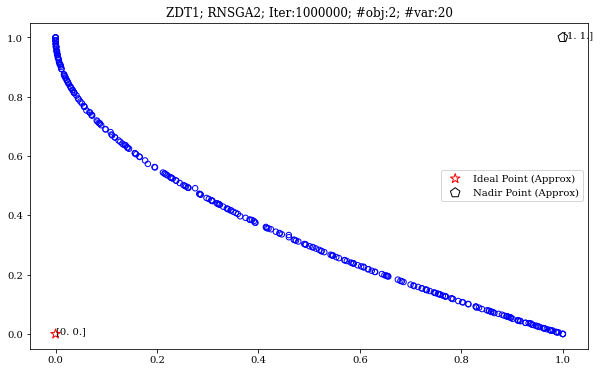

In [344]:
for i in range(len(zdt1)):
    path = zdt1['solution_path'][i]
    F = np.loadtxt(path)
    approx_ideal = F.min(axis=0)
    approx_nadir = F.max(axis=0)
    plt.figure(figsize=(10, 6))
    plt.text(approx_ideal[0], approx_ideal[1], str(np.round(approx_ideal,2)))
    plt.text(approx_nadir[0], approx_nadir[1], str(np.round(approx_nadir,2)))
    plt.scatter(F[:, 0], F[:, 1], s=30, facecolors='none', edgecolors='blue')
    plt.scatter(approx_ideal[0], approx_ideal[1], facecolors='none', edgecolors='red', marker="*", s=100, label="Ideal Point (Approx)")
    plt.scatter(approx_nadir[0], approx_nadir[1], facecolors='none', edgecolors='black', marker="p", s=100, label="Nadir Point (Approx)")
    plt.title(f"{zdt1['Problem'][i]}; {zdt1['Alg_name'][i]}; Iter:{zdt1['Iteration'][i]}; #obj:{zdt1['Objectives'][i]}; #var:{zdt1['n_variables'][i]}")
    plt.legend()
    plt.show()

# ZDT2

In [345]:


zdt2 = splits[7][1].reset_index(drop=True)

zdt2.loc[:,'ref_point'] = r"[5 5]"

#step 1, initial ref_point
ref_point = np.array([5,5])
zdt2 = hv_result(zdt2)

#step 2, nadir ideal
zdt2_final = nadir_deal_point_result(zdt2).drop(columns = 'solution_path')
zdt2_final

,Problem,Alg_name,Iteration,Objectives,n_variables,exec_time,solutions,ref_point,hv,hv_exc_time,lower_bound,upper_bound,approx_ideal,approx_nadir
0,ZDT2,AGNOMEN,100,2,10,1.964028,100,[5 5],24.321860,0.000974,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[6.148235788936323e-10, 0.0012229740292467202]","[0.9996674182000802, 1.0004237997212007]"
1,ZDT2,AGNOMEN,1000,2,10,23.567132,100,[5 5],24.327775,0.000642,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[1.4682495307493892e-13, 6.346559936224392e-08]","[0.9999999862455826, 1.0000000002611964]"
2,ZDT2,AGNOMEN,10000,2,10,249.407094,100,[5 5],24.327889,0.001066,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[5.3469219493223726e-17, 9.749707609437086e-07]","[0.9999995147198035, 1.0]"
3,ZDT2,AGNOMEN,100000,2,10,2452.771221,100,[5 5],24.327698,0.000643,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[1.0269983135304415e-07, 4.074524984494807e-08]","[0.9999999797299681, 0.9999999999999895]"
4,ZDT2,AGNOMEN,1000000,2,10,24134.109357,100,[5 5],24.327561,0.000617,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[4.7080396611266504e-08, 1.3673411092641917e-07]","[0.999999931660642, 1.0902868883641386]"
5,ZDT2,AGNOMEN,1000000,2,10,24530.974716,100,[5 5],24.327561,0.000667,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[4.7080396611266504e-08, 1.3673411092641917e-07]","[0.999999931660642, 1.0902868883641386]"
6,ZDT2,AGNOMEN,100,2,20,1.483644,100,[5 5],24.268718,0.000606,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...,[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. ...,"[0.0, 0.012968114343415283]","[0.9976828720850721, 1.0047872972001053]"
7,ZDT2,AGNOMEN,1000,2,20,23.391508,100,[5 5],24.327410,0.000691,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...,[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. ...,"[0.0, 1.2597860237233176e-07]","[0.9999999823096565, 1.0000000379754153]"
8,ZDT2,AGNOMEN,10000,2,20,242.250277,100,[5 5],24.327457,0.000653,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...,[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. ...,"[0.0, 5.433768720197461e-07]","[0.999999738874776, 1.0000000000000007]"
9,ZDT2,AGNOMEN,100000,2,20,2372.375317,100,[5 5],24.327435,0.000641,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...,[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. ...,"[0.0, 3.2814126844127343e-07]","[0.9999998557403328, 1.0]"


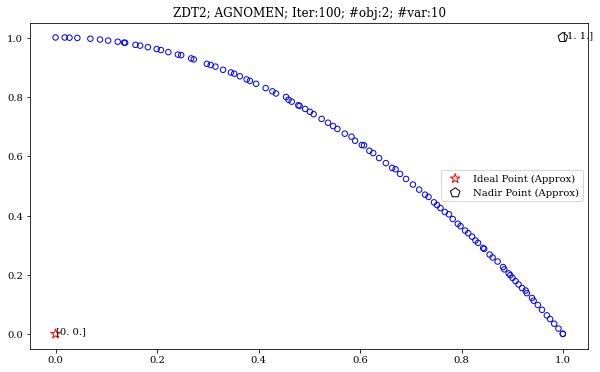

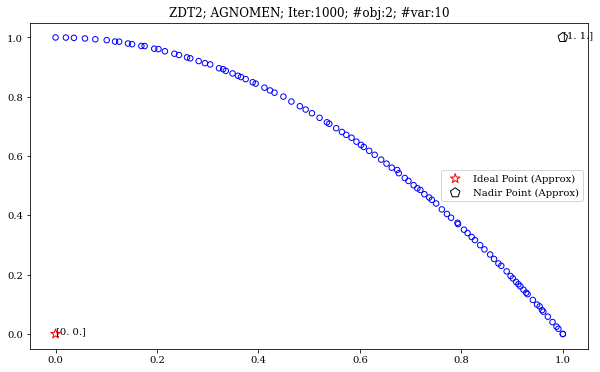

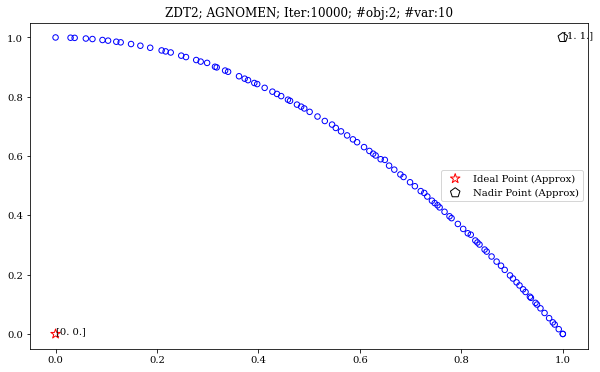

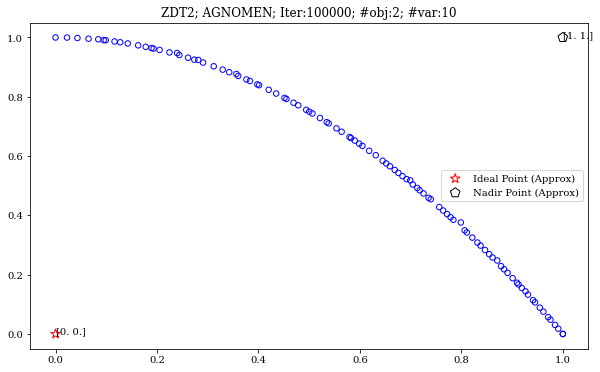

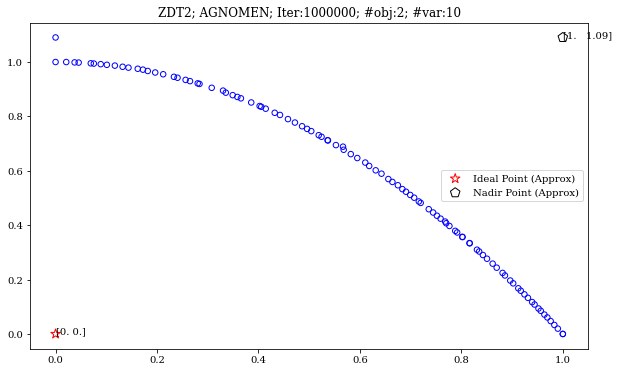

...

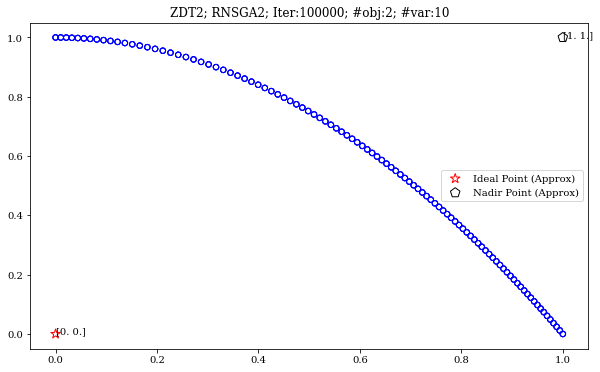

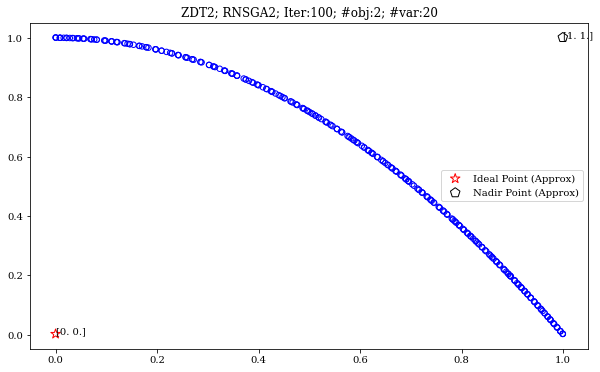

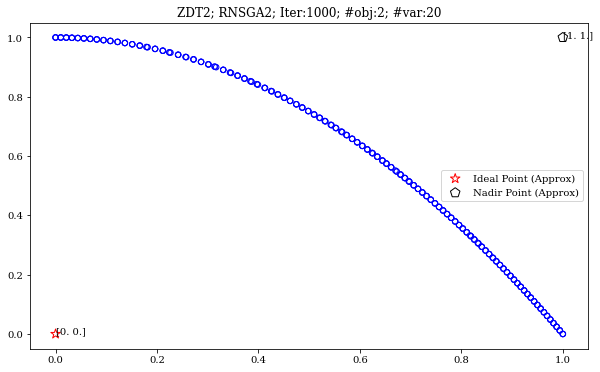

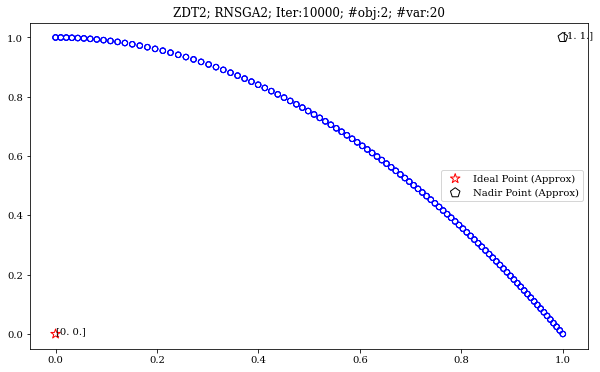

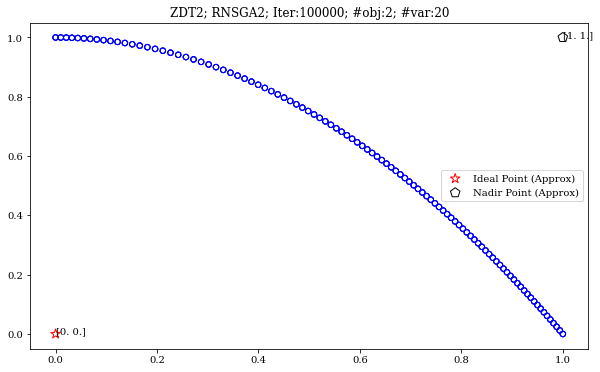

In [346]:
for i in range(len(zdt2)):
    path = zdt2['solution_path'][i]
    F = np.loadtxt(path)
    approx_ideal = F.min(axis=0)
    approx_nadir = F.max(axis=0)
    plt.figure(figsize=(10, 6))
    plt.text(approx_ideal[0], approx_ideal[1], str(np.round(approx_ideal,2)))
    plt.text(approx_nadir[0], approx_nadir[1], str(np.round(approx_nadir,2)))
    plt.scatter(F[:, 0], F[:, 1], s=30, facecolors='none', edgecolors='blue')
    plt.scatter(approx_ideal[0], approx_ideal[1], facecolors='none', edgecolors='red', marker="*", s=100, label="Ideal Point (Approx)")
    plt.scatter(approx_nadir[0], approx_nadir[1], facecolors='none', edgecolors='black', marker="p", s=100, label="Nadir Point (Approx)")
    plt.title(f"{zdt2['Problem'][i]}; {zdt2['Alg_name'][i]}; Iter:{zdt2['Iteration'][i]}; #obj:{zdt2['Objectives'][i]}; #var:{zdt2['n_variables'][i]}")
    plt.legend()
    plt.show()

# ZDT3

In [347]:


zdt3 = splits[8][1].reset_index(drop=True)

zdt3.loc[:,'ref_point'] = r"[5 5]"

#step 1, initial ref_point
ref_point = np.array([5,5])
zdt3 = hv_result(zdt3)

#step 2, nadir ideal
zdt3_final = nadir_deal_point_result(zdt3).drop(columns = 'solution_path')
zdt3_final

,Problem,Alg_name,Iteration,Objectives,n_variables,exec_time,solutions,ref_point,hv,hv_exc_time,lower_bound,upper_bound,approx_ideal,approx_nadir
0,ZDT3,AGNOMEN,100,2,10,1.869476,100,[5 5],26.818404,0.000668,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[8.234456319195378e-08, -0.4573609918478152]","[0.6532900140635942, 1.0005653208297192]"
1,ZDT3,AGNOMEN,1000,2,10,26.534295,100,[5 5],28.135008,0.000587,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[0.0, -0.7733690123259117]","[0.8518328238630473, 1.0]"
2,ZDT3,AGNOMEN,10000,2,10,333.117844,100,[5 5],28.134907,0.000568,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[0.0, -0.7733690123266284]","[0.851832870793067, 1.0]"
3,ZDT3,AGNOMEN,100000,2,10,3498.994613,100,[5 5],28.134865,0.000551,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[0.0, -0.7733690123266399]","[0.8518328641701092, 1.0]"
4,ZDT3,AGNOMEN,1000000,2,10,26761.878644,100,[5 5],28.134931,0.000537,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[0.0, -0.7733690123266406]","[0.8518328652351236, 1.0]"
5,ZDT3,AGNOMEN,1000000,2,10,27973.585301,100,[5 5],28.134931,0.000603,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[0.0, -0.7733690123266406]","[0.8518328652351236, 1.0]"
6,ZDT3,MOEAD,100,2,10,7.526511,97,[5 5],28.126243,0.000555,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[1.1899586957013486e-06, -0.7723466322748237]","[0.8506528195851136, 1.0722505916286333]"
7,ZDT3,MOEAD,1000,2,10,72.261143,100,[5 5],28.131998,0.000592,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[3.586800200600093e-09, -0.7733640283249231]","[0.8518893496751965, 1.0004732677176569]"
8,ZDT3,MOEAD,10000,2,10,800.804478,100,[5 5],28.132022,0.000515,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[1.0408340855860843e-17, -0.7733690111996654]","[0.8518321318491581, 1.000429039223565]"
9,ZDT3,MOEAD,100000,2,10,7189.611566,100,[5 5],28.132022,0.000491,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.],"[1.0408340855860843e-17, -0.7733690123260477]","[0.8518329029298362, 1.000429039223565]"


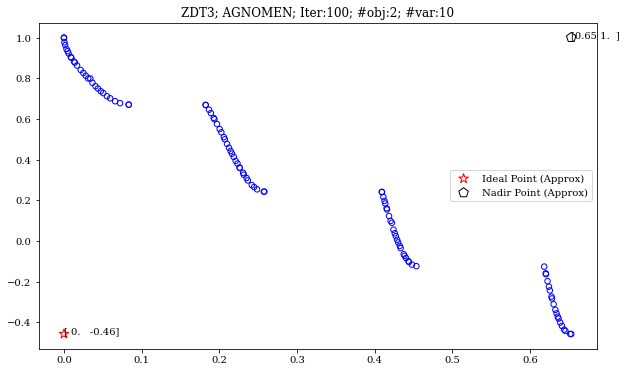

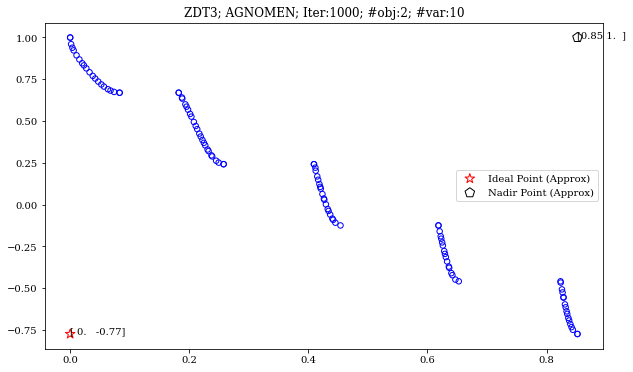

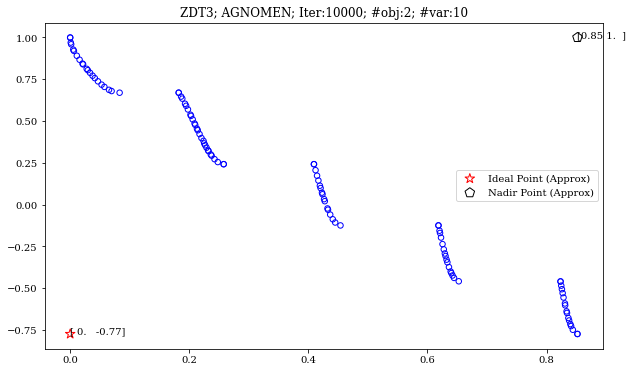

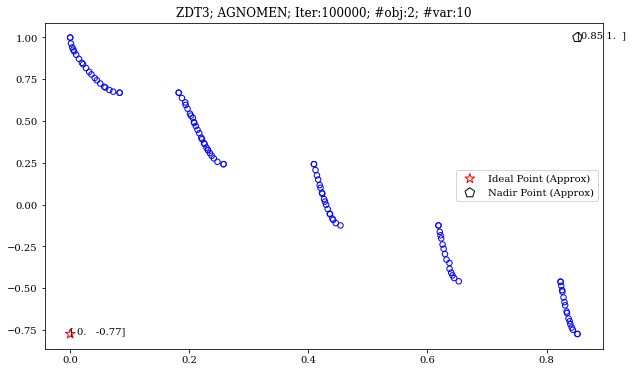

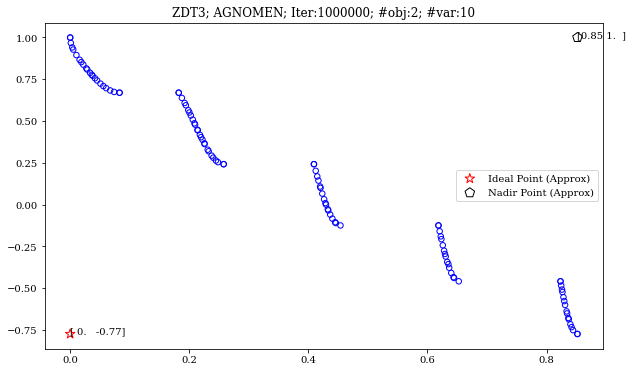

...

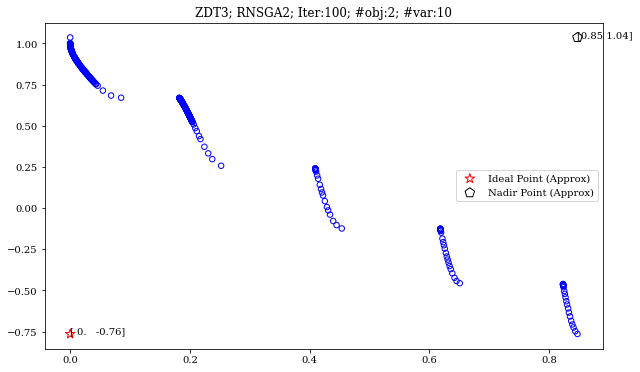

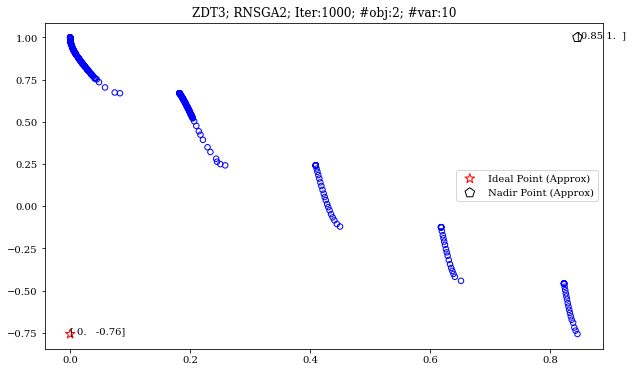

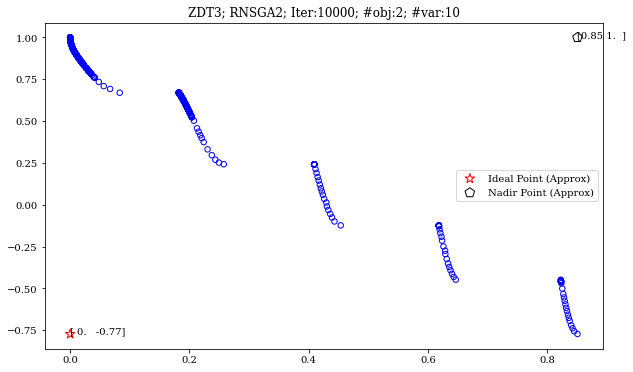

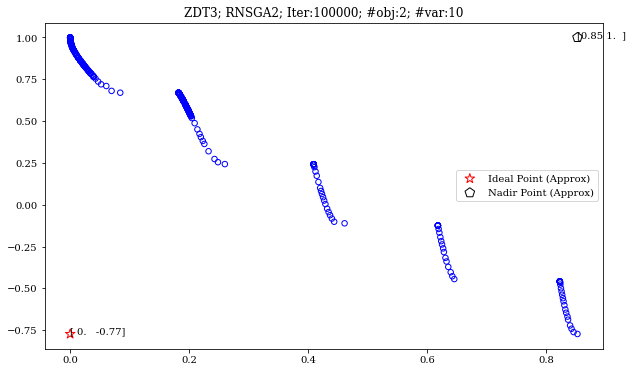

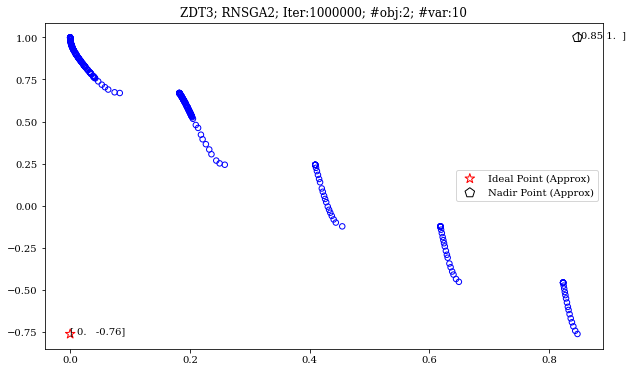

In [348]:
for i in range(len(zdt3)):
    path = zdt3['solution_path'][i]
    F = np.loadtxt(path)
    approx_ideal = F.min(axis=0)
    approx_nadir = F.max(axis=0)
    plt.figure(figsize=(10, 6))
    plt.text(approx_ideal[0], approx_ideal[1], str(np.round(approx_ideal,2)))
    plt.text(approx_nadir[0], approx_nadir[1], str(np.round(approx_nadir,2)))
    plt.scatter(F[:, 0], F[:, 1], s=30, facecolors='none', edgecolors='blue')
    plt.scatter(approx_ideal[0], approx_ideal[1], facecolors='none', edgecolors='red', marker="*", s=100, label="Ideal Point (Approx)")
    plt.scatter(approx_nadir[0], approx_nadir[1], facecolors='none', edgecolors='black', marker="p", s=100, label="Nadir Point (Approx)")
    plt.title(f"{zdt3['Problem'][i]}; {zdt3['Alg_name'][i]}; Iter:{zdt3['Iteration'][i]}; #obj:{zdt3['Objectives'][i]}; #var:{zdt3['n_variables'][i]}")
    plt.legend()
    plt.show()
